## ASSIGNMENT - 2
TEAM MEMBERS
1. ROMIT BHAUMIK, 23024
2. SIDDHARTH S DESAI, 23042
3. SUDHARSHAN VISHWANATHAN, 22842

### Imports

In [133]:
import cv2
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os
import random
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
import matplotlib.pyplot as plt 
from scipy import linalg
from torchvision.models import inception_v3
from torch.utils.data import DataLoader, Subset
from torch.autograd import Variable
import numpy as np
import torch.optim as optim
from torch.utils.data import random_split
from sklearn.metrics import f1_score
from torchvision import models
import shutil
import pandas as pd 
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

data_folder_butterfly = '/home/siddharth/siddharth/ADRL/Data/Butterfly'
data_folder_aug_butterfly = '/home/siddharth/siddharth/ADRL/Data/Butterfly_aug/Train_Aug'
data_folder_animals = '/home/siddharth/siddharth/ADRL/Data/animals'
data_folder_aug_animals = '/home/siddharth/siddharth/ADRL/Data/Animals_aug'

### 1. Preprocessing of the data

In [2]:
# Function to flip images
def copy_folders_and_flip_images(src_dir, dest_dir):
    # If dest_dir path doesn't exist, create it
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)
    if os.path.exists(dest_dir):
        shutil.rmtree(dest_dir)
    
    shutil.copytree(src_dir, dest_dir)
    
    for root, dirs, files in os.walk(dest_dir):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                with Image.open(file_path) as img:    
                    flipped_img = img.transpose(Image.FLIP_LEFT_RIGHT)
                    file_name, ext = os.path.splitext(file)
                    flipped_file_path = os.path.join(root, f"{file_name}_flipped{ext}")
                    flipped_img.save(flipped_file_path)
            except Exception as e:
                print(f"Error processing {file_path}: {e}")
                
def preprocess(data_folder):
    #List every subfolder in the data folder 
    subfolders = [f.path for f in os.scandir(data_folder) if f.is_dir()]
    print(subfolders)
    #Check size of each image in each subfolder and if shape is not 128x128x3 then resize it to 128x128x3
    for folder in subfolders:
        for filename in os.listdir(folder):
            img = cv2.imread(os.path.join(folder, filename))
            if img.shape != (128, 128, 3):
                print('Resizing image: ', os.path.join(folder, filename))
                img = cv2.resize(img, (128, 128))
                cv2.imwrite(os.path.join(folder, filename), img)
                print("Resized shape is: ", img.shape)
            else:
                print('Image size is correct: ', os.path.join(folder, filename))
    print('Preprocessing done')

    

In [ ]:
preprocess(data_folder_butterfly)
preprocess(data_folder_animals)

In [11]:
copy_folders_and_flip_images(data_folder_butterfly, data_folder_aug_butterfly)
copy_folders_and_flip_images(data_folder_animals, data_folder_aug_animals)

Error processing ../Data/Animals_aug\.DS_Store: cannot identify image file 'D:\\Academics & Assignments\\ADRL\\Data\\Animals_aug\\.DS_Store'


### 2. Dataset class 

In [12]:
class AnimalsDataset(Dataset):
    def __init__(self, data_folder, transform=None):
        self.data_folder = data_folder
        self.subfolders = [f.path for f in os.scandir(data_folder) if f.is_dir()]
        self.data = []
        self.label_map = {}
        for i, folder in enumerate(self.subfolders):
            for filename in os.listdir(folder):
                image_path = os.path.join(folder, filename)
                label_name = folder.split('/')[-1]
                self.label_map[label_name] = i
                self.data.append((image_path,i))          
        random.shuffle(self.data)
        
    def __len__(self):
        return len(self.data)
    
    def transform(self, img):
        img_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])
        return img_transform(img)
    
    def __getitem__(self, idx):
        if isinstance(idx, int):  
            img = cv2.imread(self.data[idx][0])  
            label = self.data[idx][1] 
            img = self.transform(img)  
            return img, label
        
        elif isinstance(idx, slice):  
            indices = range(*idx.indices(len(self.data)))
            batch_imgs = []
            batch_labels = []
            for i in indices:
                img = cv2.imread(self.data[i][0])  
                img = self.transform(img)  
                batch_imgs.append(img)
                batch_labels.append(self.data[i][1])
            return torch.stack(batch_imgs), batch_labels

        elif isinstance(idx, list):  
            batch_imgs = []
            batch_labels = []
            for i in idx:
                img = cv2.imread(self.data[i][0])  
                img = self.transform(img)  
                batch_imgs.append(img)
                batch_labels.append(self.data[i][0])
            
            # Return batch of images and labels
            return torch.stack(batch_imgs), batch_labels
        
        
class ButterflyDataset(Dataset):
    def __init__(self, data_folder):
        self.data_folder = data_folder
        self.desc_path = f'{data_folder}/descriptions.csv'
        self.subfolders = [f.path for f in os.scandir(data_folder) if f.is_dir()]
        desc_df = pd.read_csv(self.desc_path)
        self.data = []
        self.label_map = {}
        count_labels = 0
        for filename in os.listdir(self.subfolders[0]):
            image_path = os.path.join(self.subfolders[0], filename)
            #print(image_path)
            image_name = filename.split('_flipped')[0]
            if(not image_name.endswith('.jpg')):
                image_name = image_name + '.jpg'
            label_name = desc_df[desc_df['filename'] == image_name]['label'].values[0]
            if label_name not in self.label_map:
                self.label_map[label_name] = count_labels
                count_labels += 1
            self.data.append((image_path, self.label_map[label_name]))
        random.shuffle(self.data)
    
    def __len__(self):
        return len(self.data)
    
    def transform(self, img):
        img_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])
        return img_transform(img)
    
    def __getitem__(self, idx):
        if isinstance(idx, int):  
            #print(self.data[idx][0])
            img = cv2.imread(self.data[idx][0]) 
            #print(img) 
            label = self.data[idx][1] 
            img = self.transform(img)  
            return img, label
        
        elif isinstance(idx, slice):  
            indices = range(*idx.indices(len(self.data)))
            batch_imgs = []
            batch_labels = []
            for i in indices:
                img = cv2.imread(self.data[i][0])  
                img = self.transform(img)  
                batch_imgs.append(img)
                batch_labels.append(self.data[i][1])
            return torch.stack(batch_imgs), batch_labels

        elif isinstance(idx, list):  
            batch_imgs = []
            batch_labels = []
            for i in idx:
                img = cv2.imread(self.data[i][0])  
                img = self.transform(img)  
                batch_imgs.append(img)
                batch_labels.append(self.data[i][0])
            
            # Return batch of images and labels
            return torch.stack(batch_imgs), batch_labels
        

In [13]:
train_dataset = AnimalsDataset(data_folder_animals)


### 3. Vanilla VAE (Q.1)

#### a. Architecture

In [4]:
class VAE(nn.Module):
    def __init__(self, z_dim, layer_count=5, channels=3, d=128, mul=1):
        super(VAE, self).__init__()

        
        self.d = d
        self.z_dim = z_dim

        self.layer_count = layer_count

        # Encoder Network
        self.mul = mul
        inputs = channels
        for i in range(self.layer_count):
            setattr(self, "conv%d" % (i + 1), nn.Conv2d(inputs, self.d * self.mul, 4, 2, 1))
            setattr(self, "conv%d_bn" % (i + 1), nn.BatchNorm2d(self.d * self.mul))
            inputs = self.d * self.mul
            self.mul *= 2

        self.d_max = inputs

        self.fc1 = nn.Linear(inputs * 4 * 4, self.z_dim)
        self.fc2 = nn.Linear(inputs * 4 * 4, self.z_dim)

        # Decoder Network
        self.d1 = nn.Linear(self.z_dim, inputs * 4 * 4)

        self.mul = inputs // self.d // 2

        for i in range(1, self.layer_count):
            setattr(self, "deconv%d" % (i + 1), nn.ConvTranspose2d(inputs, self.d * self.mul, 4, 2, 1))
            setattr(self, "deconv%d_bn" % (i + 1), nn.BatchNorm2d(self.d *self. mul))
            inputs = self.d * self.mul
            self.mul //= 2

        setattr(self, "deconv%d" % (self.layer_count + 1), nn.ConvTranspose2d(inputs, channels, 4, 2, 1))

    def encode(self, x):
        for i in range(self.layer_count):
            x = F.relu(getattr(self, "conv%d_bn" % (i + 1))(getattr(self, "conv%d" % (i + 1))(x)))
        # print("Before encode", x.shape)
        x = x.view(x.shape[0], self.d_max * 4 * 4)
        # print("After encode", x.shape)
        mu = self.fc1(x)
        logvar = self.fc2(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        if self.training:
            std = torch.exp(0.5 * logvar)
            eps = torch.randn_like(std)
            return eps.mul(std).add_(mu)
        else:
            return mu

    def decode(self, x):
        x = x.view(x.shape[0], self.z_dim)
        x = self.d1(x)
        x = x.view(x.shape[0], self.d_max, 4, 4)
        #x = self.deconv1_bn(x)
        x = F.leaky_relu(x, 0.2)

        for i in range(1, self.layer_count):
            x = F.leaky_relu(getattr(self, "deconv%d_bn" % (i + 1))(getattr(self, "deconv%d" % (i + 1))(x)), 0.2)

        x = F.tanh(getattr(self, "deconv%d" % (self.layer_count + 1))(x))
        return x

    def forward(self, x):
        mu, logvar = self.encode(x)
        mu = mu.squeeze()
        logvar = logvar.squeeze()
        z = self.reparameterize(mu, logvar)
        return self.decode(z.view(-1, self.z_dim, 1, 1)), mu, logvar

    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)


def normal_init(m, mean, std):
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()

#### b. Training Loop 

In [52]:
def loss_function(recon_x, x, mu, logvar, scaling_factor):
    MSE = torch.mean((recon_x - x)**2)

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    
    KLD = -0.5 * torch.mean(torch.mean(1 + logvar - mu.pow(2) - logvar.exp(), 1))
    return MSE, KLD * scaling_factor



def train(**kwargs): 
    z_dim = kwargs.get('z_dim', 128)
    batch_size = kwargs.get('batch_size', 128)
    train_epoch = kwargs.get('train_epoch', 40)
    model_path = kwargs.get('pretrained_model_path', None)
    lr = kwargs.get('lr', 0.0005)
    layer_count = kwargs.get('layer_count', 5)
    device = kwargs.get('device', 'cuda')
    train_data = kwargs.get('train_data', None)
    save_after = kwargs.get('save_after', 10)
    scaling_factor = kwargs.get('scaling_factor', 0.2)


    loss_file = './Losses/vae_loss.txt'

    # if not os.path.exists('./Losses'):
    #     os.makedirs('./Losses')
    # if not os.path.exists('./Models'):
    #     os.makedirs('./Models')
    if train_data is None:
        raise ValueError("train_data is required")
    
    # with open(loss_file, 'a') as f:
    #         f.write(f'Epoch \t Rec_Loss \t KL_Loss \t Combined_Loss\n')

    if model_path is None :
        vae = VAE(z_dim=z_dim, layer_count=layer_count)
        vae.weight_init(mean=0.0, std=0.02)
    else:
        vae = torch.load(model_path)
        
    vae = vae.to(device)
    vae.train()

    vae_optimizer = optim.Adam(vae.parameters(), lr=lr, betas=(0.5, 0.999), weight_decay=1e-5)
    for epoch in range(train_epoch):
        vae.train()
        rec_loss = 0
        kl_loss = 0
        combined_loss = 0

        # Reduce learning rate after every 8 epochs
        if (epoch + 1) % 8 == 0:
            vae_optimizer.param_groups[0]['lr'] /= 4
            print("learning rate change!")
            
        train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
        tqdm_batch = tqdm(train_loader, desc=f'VAE training: Epoch {epoch}/{train_epoch}')
        for data, _ in tqdm_batch:
            data = data.to(device)
            print(data.shape)
            vae_optimizer.zero_grad()
            rec, mu, logvar = vae(data)

            loss_re, loss_kl = loss_function(rec, data, mu, logvar, scaling_factor)
            (loss_re + loss_kl).backward()
            vae_optimizer.step()
            rec_loss += loss_re.item()
            kl_loss += loss_kl.item()
            combined_loss += rec_loss + kl_loss
            tqdm_batch.set_postfix(rec_loss=rec_loss, kl_loss=kl_loss, combined_loss=combined_loss)
        print(f'Epoch {epoch}/{train_epoch} Loss: {combined_loss}')
        
        # with open(loss_file, 'a') as f:
        #     f.write(f'{epoch} \t {rec_loss:.4f} \t {kl_loss:.4f} \t {combined_loss:.4f}\n')
            
        # if (epoch + 1) % save_after == 0:
        #     torch.save(vae, f'Models/vae_{epoch}.pth')
            

##### i. Animal train

In [ ]:
#Usage
args = {'z_size': 128,
        'batch_size': 128,
        'train_epoch': 200,
        'pretrained_model_path': None,
        'lr': 0.0005,
        'layer_count': 5,
        'device': 'cuda',
        'train_data': train_dataset,
        'save_after': 10,
        'scaling_factor':0.3}
train(**args)

##### ii. Butterfly train

In [7]:
train_dataset_butterfly = ButterflyDataset(data_folder_aug_butterfly)

In [ ]:
#Usage
args = {'z_size': 512,
        'batch_size': 128,
        'train_epoch': 400,
        'pretrained_model_path': None,
        'lr': 0.0005,
        'layer_count': 5,
        'device': 'cuda',
        'train_data': train_dataset_butterfly,
        'save_after': 10,
        'scaling_factor':0.3,
        }
train(**args)

#### c. Inference and Results

In [50]:
def plot_img_vae(model_path, z_dim, layer_count,num_images=10, device = "cpu"):
    vae = torch.load(model_path)
    vae.to(device)
    vae.eval()

    fig, axes = plt.subplots(num_images, num_images, figsize=(10, 10))

    with torch.no_grad():  
        for i in range(num_images):
            for j in range(num_images):
                z = torch.randn(1,z_dim)
                # logvar = torch.log(torch.randn(1, z_dim))  
                
                # z = vae.reparameterize(mu,logvar)

                img = vae.decode(z.view(1, z_dim, 1, 1))  
                
                img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  
                img = (img + 1) * 127.5  
                img = img.astype(np.uint8)  

                axes[i, j].imshow(img)
                axes[i, j].axis('off')  

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

def plot_img_with_enc(model_path, z_dim, layer_count, img, device="cpu"):
    vae = torch.load(model_path)
    vae.to(device)
    vae.eval()  
    with torch.no_grad():
        if img.dim() == 3:  
            img = img.unsqueeze(0)  
        
        rec, mu, logvar = vae(img)
       
        rec = rec.squeeze(0).permute(1, 2, 0).cpu().numpy()  
        rec = (rec + 1) * 127.5  
        rec = rec.astype(np.uint8)  

        
        plt.imshow(rec)
        plt.axis('off') 
        plt.show()

def plot_losses(loss_file):
    epochs = []
    rec_losses = []
    kl_losses = []
    combined_losses = []

    with open(loss_file, 'r') as f:
        next(f)
        for line in f:
            epoch, rec_loss, kl_loss, combined_loss = map(float, line.split())
            epochs.append(epoch)
            rec_losses.append(rec_loss)
            kl_losses.append(kl_loss)
            combined_losses.append(combined_loss)

    
    epochs = np.array(epochs)
    rec_losses = np.array(rec_losses)
    kl_losses = np.array(kl_losses)
    combined_losses = np.array(combined_losses)

    plt.figure(figsize=(12, 6))
    plt.plot(epochs, rec_losses, label='Reconstruction Loss', color='blue', marker='o')
    plt.plot(epochs, kl_losses, label='KL Divergence Loss', color='orange', marker='o')
    plt.plot(epochs, combined_losses, label='Combined Loss', color='green', marker='o')

    plt.title('Loss Curves for VAE Training')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    plt.ylim(0, 20) 
    plt.legend()
    plt.grid()
    plt.show()

def plot_fid_scores(file_path):
    epochs = []
    fid_scores = []

    with open(file_path, 'r') as f:
        lines = f.readlines()

        for line in lines:
            if "Epoch" in line and "FID Score" in line:
                parts = line.split(',')
                epoch_part = parts[0].strip().split(" ")[1]
                fid_part = parts[1].strip().split(":")[1]

                epochs.append(int(epoch_part))
                fid_scores.append(float(fid_part))

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, fid_scores, marker='o', linestyle='-', color='b', label='FID Score')
    plt.xlabel('Epochs')
    plt.ylabel('FID Score')
    plt.title('FID Score vs. Epochs')
    plt.grid(True)
    plt.legend()
    plt.show()

# Function to calculate the FID between two sets of images
def calculate_fid(real_images, generated_images, batch_size=32, device='cuda'):
    
    model = inception_v3(pretrained=True, transform_input=False).to(device)
    model.fc = nn.Identity()  
    model.eval()  
    act1 = get_activations(real_images, model, batch_size, device)
    act2 = get_activations(generated_images, model, batch_size, device)
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    fid_score = calculate_frechet_distance(mu1, sigma1, mu2, sigma2)
    return fid_score

def get_activations(images, model, batch_size, device):
    dataloader = DataLoader(images, batch_size=batch_size, shuffle=False)
    activations = []

    with torch.no_grad():
        for batch in dataloader:
            batch = batch.to(device)
            pred = model(batch)
            activations.append(pred.cpu().numpy())
    
    activations = np.concatenate(activations, axis=0)
    return activations

# Function to preprocess images (resize and normalize)
def preprocess_images(images, image_size=(299, 299)):
    preprocess = transforms.Compose([
        transforms.Resize(image_size),
        transforms.Lambda(lambda x: (x + 1) / 2), 
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    processed_images = [preprocess(img) for img in images]
    return torch.stack(processed_images)


def calculate_frechet_distance(mu1, sigma1, mu2, sigma2):
    diff = mu1 - mu2
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean)
    
    return fid

def compute_fid(model,data_loc, z_dim):
    test_dataset = ButterflyDataset(data_loc)
    
    #Sample 1000 images from the dataset
    sample_indices = random.sample(range(len(test_dataset)), 1000)
    sample_images = [test_dataset[i][0] for i in sample_indices]
    
    with torch.no_grad():
        z = torch.randn(1000, z_dim).to("cuda")
        img = model.decode(z.view(1000, z_dim, 1, 1)).to("cuda")
        
        
    img_list = [img[i] for i in range(1000)]
    img_list[0].shape
        
    preprocessed_real_images = preprocess_images(sample_images)
    preprocessed_generated_images = preprocess_images(img_list)
    
    fid_score = calculate_fid(preprocessed_real_images, preprocessed_generated_images)
    return fid_score

##### ANIMALS_DATASET TRIALS


###### Try 1:  

Hyperparameters are:

'z_size': 128,
 
'batch_size': 128,
  
'train_epoch': 600,
    
'lr': 0.0005,
  
'layer_count': 5,

'scaling_factor' : 0.1, 

/tmp/ipykernel_5633/584089213.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load(model_path)


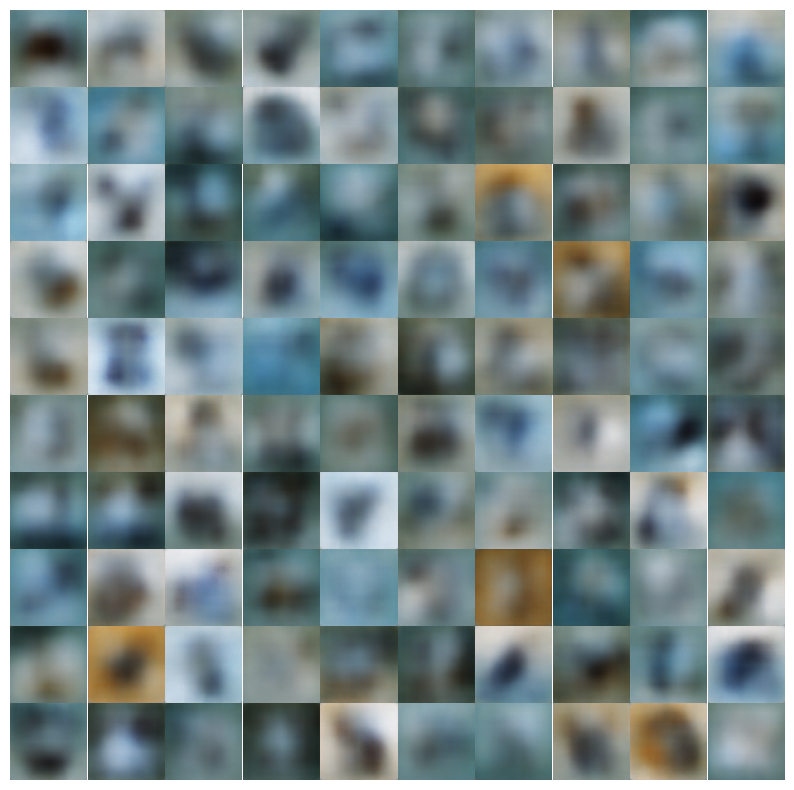

In [44]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/vanilla_vae/vae_599.pth"

z_dim = 128  
layer_count = 5

img, label = train_dataset[4]
img = img.unsqueeze(0)

plot_img_vae(model_path, z_dim, layer_count, num_images=10)


In [2]:
# def update_combined_loss(loss_file, updated_file):
#     epochs = []
#     rec_losses = []
#     kl_losses = []
#     combined_losses = []

#     # Read the loss data from the file
#     with open(loss_file, 'r') as f:
#         next(f)  # Skip the header
#         for line in f:
#             epoch, rec_loss, kl_loss, _ = map(float, line.split())
#             epochs.append(epoch)
            
            
#             rec_losses.append(rec_loss)

#             kl_loss = kl_loss/0.3
#             kl_lossloss_file_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Losses/vae_loss_1.txt"
# plot_losses(loss_file_path)
# es.append(kl_loss)

#             # Calculate combined loss
#             combined_loss = rec_loss + kl_loss
#             combined_losses.append(combined_loss)

#     # Write the updated data to a new file
#     with open(updated_file, 'w') as f:
#         f.write("Epoch \t Rec_Loss \t KL_Loss \t Combined_Loss\n")
#         for epoch, rec_loss, kl_loss, combined_loss in zip(epochs, rec_losses, kl_losses, combined_losses):
#             f.write(f"{epoch} \t {rec_loss:.4f} \t {kl_loss:.4f} \t {combined_loss:.4f}\n")

# # Usage
# loss_file_path = '/home/siddharth/siddharth/ADRL/Assignment 2/Losses/vae_loss_2.txt'  # Replace with your actual loss file path
# updated_file_path = '/home/siddharth/siddharth/ADRL/Assignment 2/Losses/vae_loss_2.txt'  # Specify a path for the updated file
# update_combined_loss(loss_file_path, updated_file_path)


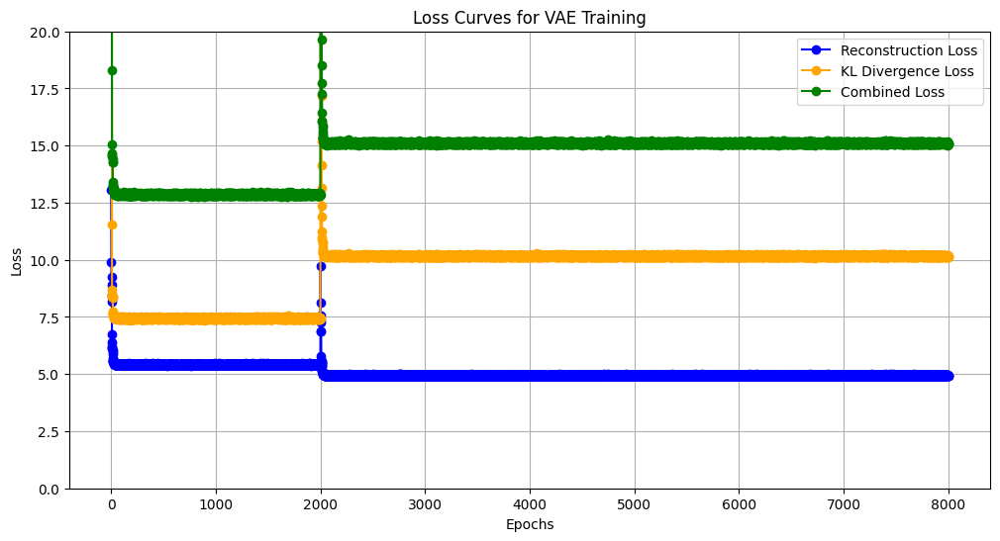

In [7]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Losses/vae_loss_1.txt"
plot_losses(loss_file_path)



In [24]:

fid_file_path = ""
# with open(fid_file_path,'w') as f:

vae = torch.load("/home/siddharth/siddharth/ADRL/Assignment 2/Models/vanilla_vae/vae_299.pth")
vae.to("cpu")
fid_score = compute_fid(vae, data_folder_aug_animals, 128)
# f.write(f"Epoch {epoch}, FID Score: {fid_score}\n")
# f.flush()

/tmp/ipykernel_12389/1700820546.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load("/home/siddharth/siddharth/ADRL/Assignment 2/Models/vanilla_vae/vae_299.

In [25]:
fid_score

290.4831125927109

###### Try 2:  

Hyperparameters are:

'z_size': 128,
 
'batch_size': 128,
  
'train_epoch': 200,
    
'lr': 0.0005,
  
'layer_count': 5,

'scaling_factor' : 0.3, 



/tmp/ipykernel_5633/1672211979.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load(model_path)


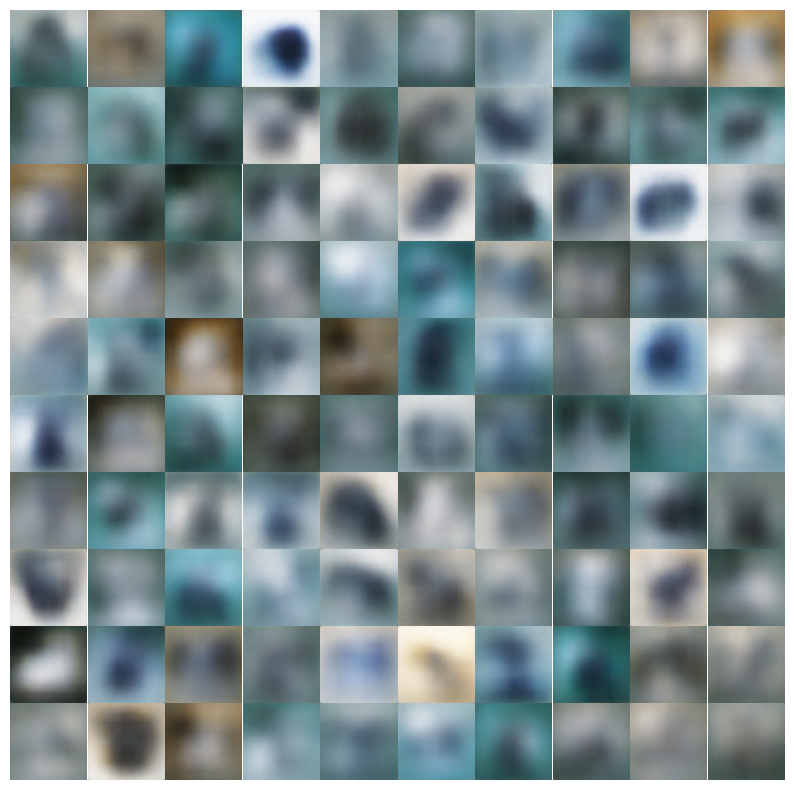

In [49]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/vanilla_vae/vae_499.pth"

z_dim = 128  
layer_count = 5

img, label = train_dataset[4]
img = img.unsqueeze(0)

plot_img_vae(model_path, z_dim, layer_count, num_images=10)

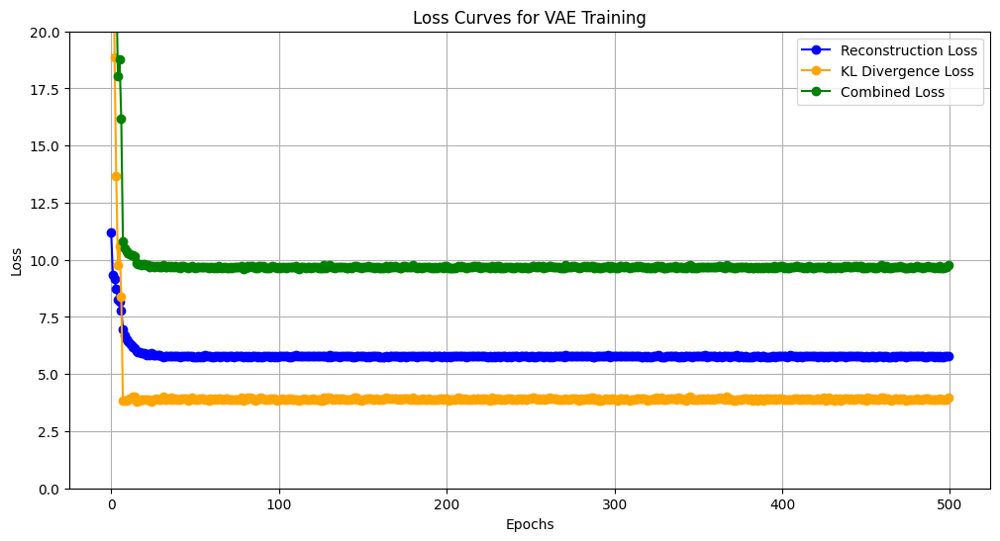

In [9]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Losses/vae_loss_2.txt"
plot_losses(loss_file_path)

###### Try 3:  

Hyperparameters are:

'z_size': 128,
 
'batch_size': 128,
  
'train_epoch': 200,
    
'lr': 0.0005,
  
'layer_count': 5,

'scaling_factor' : 1, 

/tmp/ipykernel_12175/3406746538.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load(model_path)


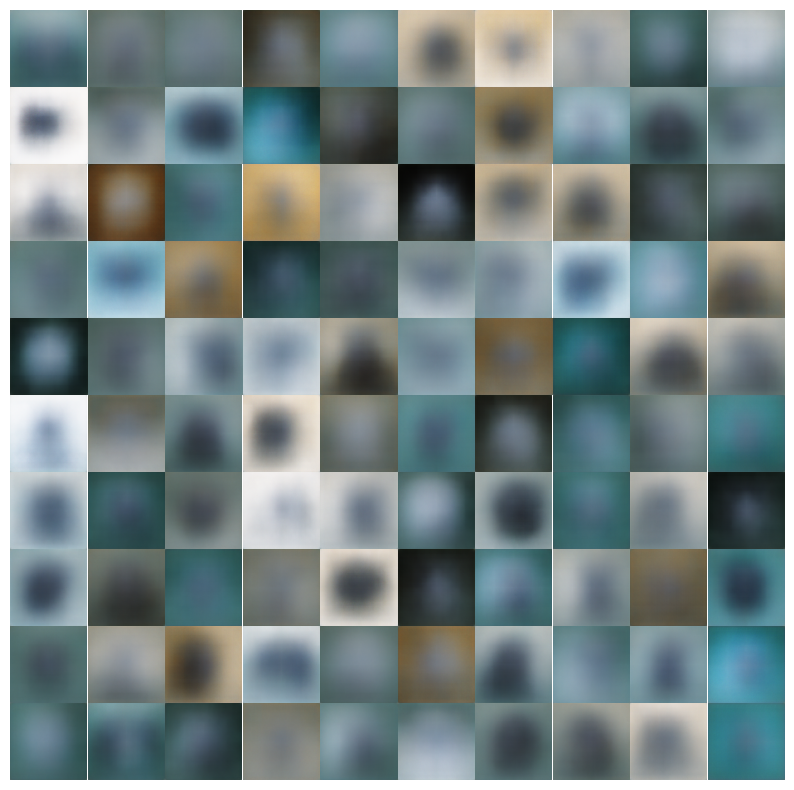

In [7]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/vanilla_vae/vae_499.pth"

z_dim = 128  
layer_count = 5

img, label = train_dataset[4]
img = img.unsqueeze(0)

plot_img_vae(model_path, z_dim, layer_count, num_images=10)

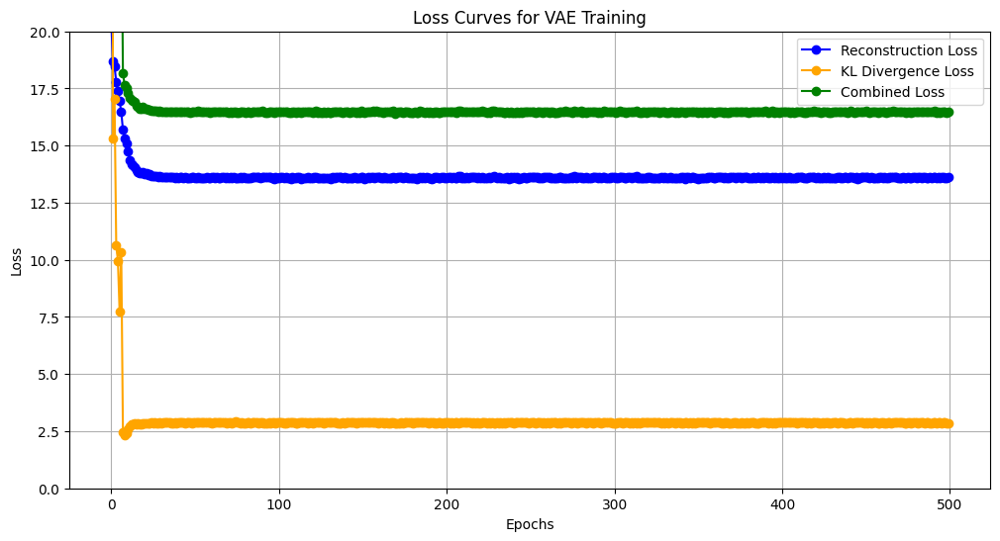

In [11]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Losses/vae_loss_3.txt"
plot_losses(loss_file_path)

###### Try 4:  

Hyperparameters are:

'z_size': 512,
 
'batch_size': 128,
  
'train_epoch': 200,
    
'lr': 0.0005,
  
'layer_count': 5,

'scaling_factor' : 1, 


/tmp/ipykernel_12175/3406746538.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load(model_path)


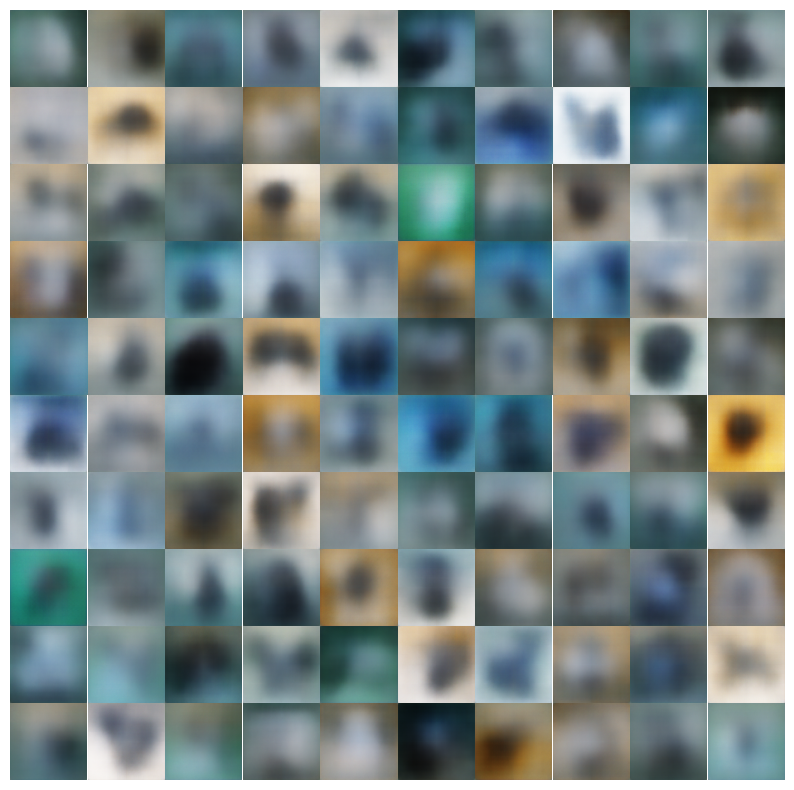

In [27]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/vanilla_vae_4/vae_149.pth"

z_dim = 512
layer_count = 5

img, label = train_dataset[4]
img = img.unsqueeze(0)

plot_img_vae(model_path, z_dim, layer_count, num_images=10)

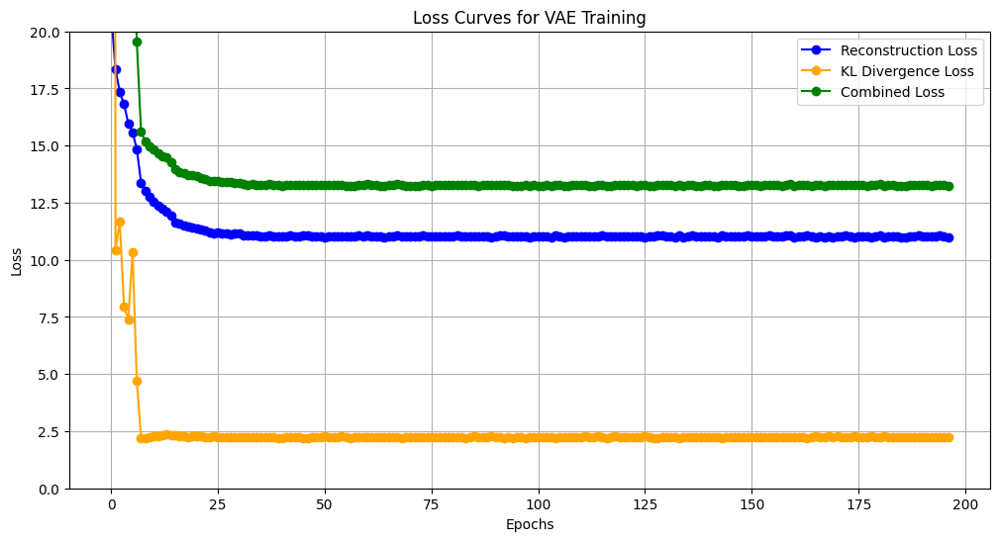

In [34]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Losses/vae_loss_4.txt"
plot_losses(loss_file_path)

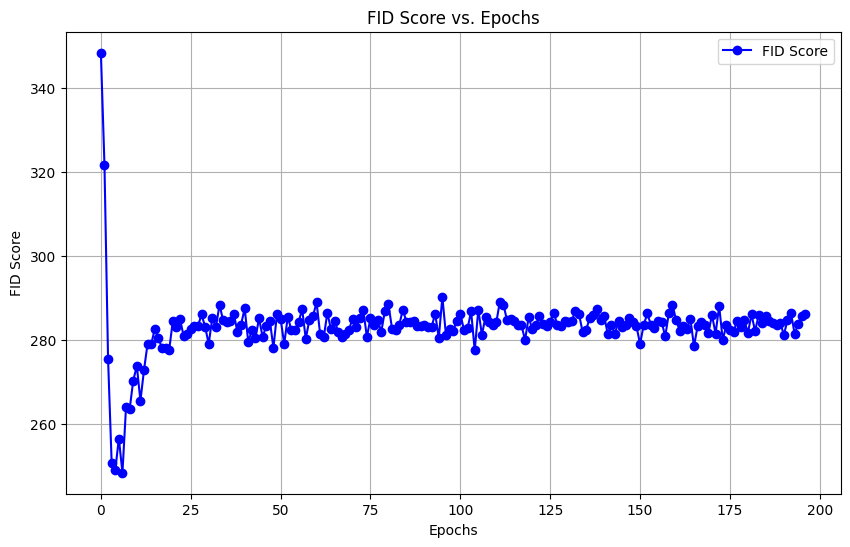

In [14]:
plot_fid_scores("/home/siddharth/siddharth/ADRL/Assignment 2/FIDs/fid_4.txt")

#### Butterfly Dataset Trials

###### Try 1:  

Hyperparameters are:

'z_size': 512,
 
'batch_size': 128,
  
'train_epoch': 400,
    
'lr': 0.0005,
  
'layer_count': 5,

'scaling_factor' : 0.1, 

/tmp/ipykernel_14915/1677577573.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load(model_path)


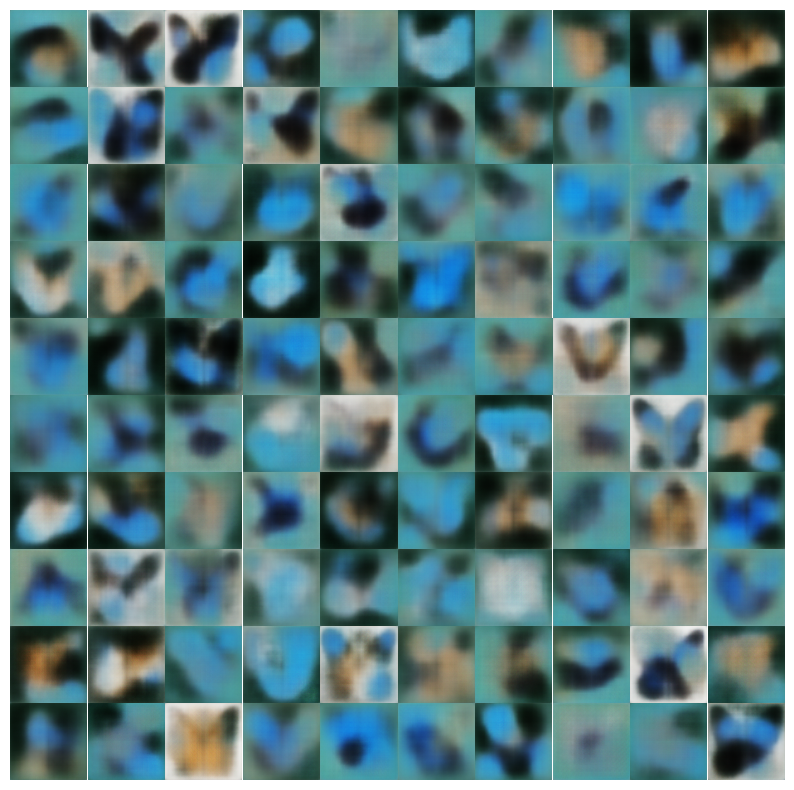

In [16]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/vanilla_vae_bf_1/vae_99.pth"

z_dim = 512
layer_count = 5

plot_img_vae(model_path, z_dim, layer_count, num_images=10)

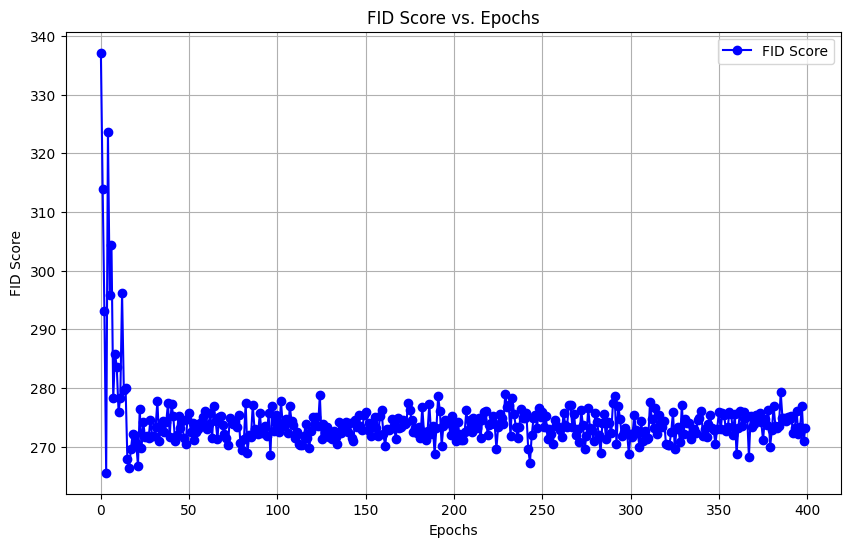

In [15]:
plot_fid_scores("/home/siddharth/siddharth/ADRL/Assignment 2/FIDs/fid_bf_1.txt")

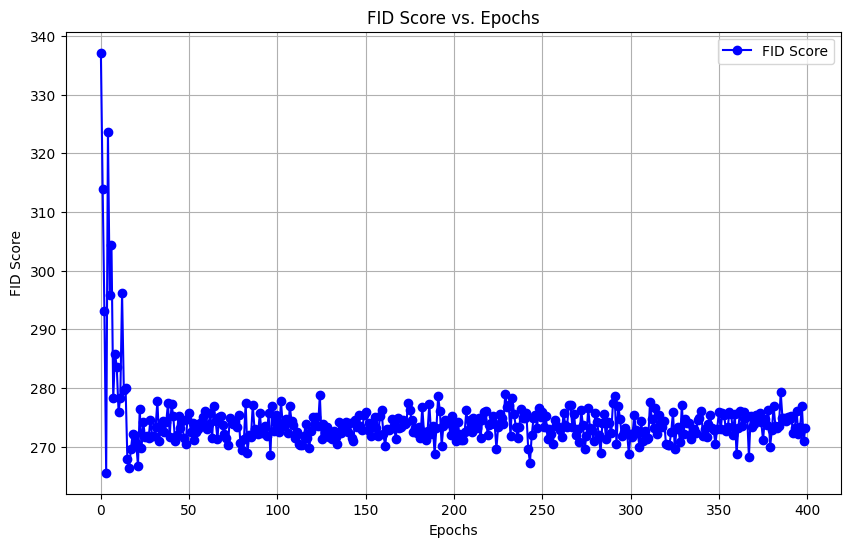

In [35]:
plot_fid_scores("/home/siddharth/siddharth/ADRL/Assignment 2/FIDs/fid_bf_1.txt")

### 4. CNN-based Classifier (Q.2)

##### Preprocessing

In [17]:
dataset = AnimalsDataset(data_folder_aug_animals)

#Split the dataset into training , validation and test sets
n = len(dataset)
train_size = int(0.8 * n)
val_size = (n - train_size) // 2
test_size = n - train_size - val_size
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

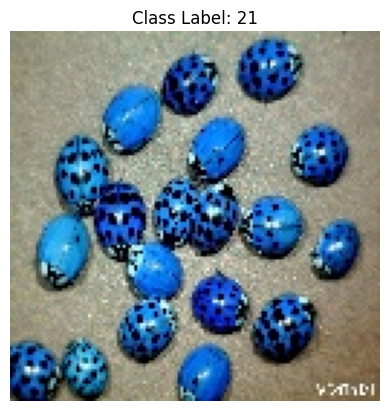

In [18]:
tensor_image = train_dataset[0][0]  
label = train_dataset[0][1] 

denormalized_image = (tensor_image + 1) / 2

image_np = denormalized_image.numpy()

image_np = np.transpose(image_np, (1, 2, 0))

plt.imshow(image_np)
plt.title(f"Class Label: {label}")
plt.axis('off')  # Hide the axes
plt.show()

In [19]:
dataset.label_map

{'squirrel': 0,
 'beetle': 1,
 'cockroach': 2,
 'seal': 3,
 'panda': 4,
 'bee': 5,
 'seahorse': 6,
 'dog': 7,
 'caterpillar': 8,
 'goldfish': 9,
 'bat': 10,
 'goose': 11,
 'flamingo': 12,
 'oyster': 13,
 'possum': 14,
 'swan': 15,
 'whale': 16,
 'octopus': 17,
 'pelecaniformes': 18,
 'duck': 19,
 'starfish': 20,
 'ladybugs': 21,
 'turtle': 22,
 'fox': 23,
 'okapi': 24,
 'antelope': 25,
 'dolphin': 26,
 'badger': 27,
 'rat': 28,
 'hummingbird': 29,
 'elephant': 30,
 'lobster': 31,
 'fly': 32,
 'orangutan': 33,
 'wombat': 34,
 'butterfly': 36,
 'turkey': 37,
 'mosquito': 38,
 'leopard': 39,
 'moth': 40,
 'horse': 41,
 'lizard': 42,
 'tiger': 43,
 'ox': 44,
 'hare': 45,
 'snake': 46,
 'porcupine': 47,
 'koala': 48,
 'penguin': 49,
 'sandpiper': 50,
 'bison': 51,
 'chimpanzee': 52,
 'reindeer': 53,
 'cat': 54,
 'parrot': 55,
 'mouse': 56,
 'coyote': 57,
 'kangaroo': 58,
 'donkey': 59,
 'shark': 60,
 'eagle': 61,
 'sheep': 62,
 'sparrow': 63,
 'cow': 64,
 'pig': 65,
 'dragonfly': 66,
 'crab

##### a. Custom CNN Classifier

In [20]:
class CNNClassifier(nn.Module):
    def __init__(self, num_classes=91):
        super(CNNClassifier, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(128 * 16 * 16, 512)
        self.fc2 = nn.Linear(512, num_classes)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.pool(x)
        x = self.relu(self.conv2(x))
        x = self.pool(x)
        x = self.relu(self.conv3(x))
        x = self.pool(x)
        x = x.view(x.size(0), -1)  
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

In [24]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, device):
    model.to(device)
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0
        
        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            correct_train += (predicted == labels).sum().item()
            total_train += labels.size(0)
        
        train_accuracy = 100 * correct_train / total_train
        print(f"Training Loss: {running_loss / len(train_loader):.4f}, Accuracy: {train_accuracy:.2f}%")

        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        
        with torch.no_grad():
            for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                correct_val += (predicted == labels).sum().item()
                total_val += labels.size(0)
        
        val_accuracy = 100 * correct_val / total_val
        print(f"Validation Loss: {val_loss / len(val_loader):.4f}, Validation Accuracy: {val_accuracy:.2f}%")


def test_model(model, test_loader, criterion, device):
    model.eval()
    test_loss = 0.0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            test_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            correct_test += (predicted == labels).sum().item()
            total_test += labels.size(0)

    test_accuracy = 100 * correct_test / total_test
    print(f"Test Loss: {test_loss / len(test_loader):.4f}, Test Accuracy: {test_accuracy:.2f}%")


In [ ]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

num_classes = 91
lr = 0.001
epochs = 50
device = torch.device('cuda' if torch.cuda.is_available() else "cpu")

model = CNNClassifier(num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),lr = lr)

train_model(model, train_loader, val_loader, criterion, optimizer, epochs, device)

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

num_classes = 91
lr = 0.001
epochs = 50
device = torch.device('cuda' if torch.cuda.is_available() else "cpu")

model = CNNClassifier(num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),lr = lr)

train_model(model, train_loader, val_loader, criterion, optimizer, epochs, device)

In [33]:
test_model(model, test_loader, criterion, device)

Testing: 100%|██████████| 34/34 [00:00<00:00, 131.85it/s]

Test Loss: 4.7125, Test Accuracy: 44.35%


##### b. Resnet

In [7]:
class ResNetClassifier(nn.Module):
    def __init__(self, num_classes, pretrained=True, resnet_type="resnet101"):
        super(ResNetClassifier, self).__init__()
        if resnet_type == "resnet101":
            self.model = models.resnet101(pretrained=pretrained)
        elif resnet_type == "resnet152":
            self.model = models.resnet152(pretrained=pretrained)
        else:
            raise ValueError("Unsupported ResNet type")

        # Modify the final fully connected layer
        in_features = self.model.fc.in_features
        self.model.fc = nn.Linear(in_features, num_classes)
    
    def forward(self, x):
        return self.model(x)

In [8]:
def train_model_resnet(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=25):
    model = model.to(device)
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        with tqdm(train_loader, unit="batch") as tepoch:
            for inputs, labels in tepoch:
                tepoch.set_description(f"Epoch {epoch+1}/{num_epochs}")

                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()

                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                _, predicted = outputs.max(1)
                correct += predicted.eq(labels).sum().item()
                total += labels.size(0)
                
                tepoch.set_postfix(loss=running_loss/total, accuracy=100.*correct/total)

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        with torch.no_grad():
            with tqdm(val_loader, unit="batch") as vepoch:
                for inputs, labels in vepoch:
                    inputs, labels = inputs.to(device), labels.to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    val_loss += loss.item() * inputs.size(0)
                    _, predicted = outputs.max(1)
                    val_correct += predicted.eq(labels).sum().item()
                    val_total += labels.size(0)
                    vepoch.set_postfix(val_loss=val_loss/val_total, val_accuracy=100.*val_correct/val_total)

        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/total:.4f}, Accuracy: {100.*correct/total:.2f}%, Val Loss: {val_loss/val_total:.4f}, Val Accuracy: {100.*val_correct/val_total:.2f}%")

# Testing function
def test_model_resnet(model, test_loader, criterion, device):
    model = model.to(device)
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        with tqdm(test_loader, unit="batch") as testepoch:
            for inputs, labels in testepoch:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                test_loss += loss.item() * inputs.size(0)
                _, predicted = outputs.max(1)
                correct += predicted.eq(labels).sum().item()
                total += labels.size(0)
                testepoch.set_postfix(test_loss=test_loss/total, test_accuracy=100.*correct/total)

    print(f"Test Loss: {test_loss/total:.4f}, Test Accuracy: {100.*correct/total:.2f}%")


In [10]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = ResNetClassifier(num_classes=91, resnet_type="resnet101", pretrained=True)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
train_model_resnet(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=25)


100%|██████████| 34/34 [00:00<00:00, 49.69batch/s, val_accuracy=10.4, val_loss=3.92]


Epoch [1/25], Loss: 4.0989, Accuracy: 6.89%, Val Loss: 3.9243, Val Accuracy: 10.37%


100%|██████████| 34/34 [00:00<00:00, 51.66batch/s, val_accuracy=19.7, val_loss=3.43]


Epoch [2/25], Loss: 3.1871, Accuracy: 19.91%, Val Loss: 3.4271, Val Accuracy: 19.72%


100%|██████████| 34/34 [00:00<00:00, 50.42batch/s, val_accuracy=30.6, val_loss=2.67]


Epoch [3/25], Loss: 2.5590, Accuracy: 32.64%, Val Loss: 2.6747, Val Accuracy: 30.65%


100%|██████████| 34/34 [00:00<00:00, 51.46batch/s, val_accuracy=39.5, val_loss=2.44]


Epoch [4/25], Loss: 2.0436, Accuracy: 44.11%, Val Loss: 2.4391, Val Accuracy: 39.54%


100%|██████████| 34/34 [00:00<00:00, 49.35batch/s, val_accuracy=47.6, val_loss=2.06]


Epoch [5/25], Loss: 1.5164, Accuracy: 57.31%, Val Loss: 2.0580, Val Accuracy: 47.59%


100%|██████████| 34/34 [00:00<00:00, 50.24batch/s, val_accuracy=51.3, val_loss=1.96]


Epoch [6/25], Loss: 1.1386, Accuracy: 67.06%, Val Loss: 1.9639, Val Accuracy: 51.30%


100%|██████████| 34/34 [00:00<00:00, 49.07batch/s, val_accuracy=62.8, val_loss=1.53]


Epoch [7/25], Loss: 0.6287, Accuracy: 81.78%, Val Loss: 1.5314, Val Accuracy: 62.78%


100%|██████████| 34/34 [00:00<00:00, 49.43batch/s, val_accuracy=64.3, val_loss=1.38]


Epoch [8/25], Loss: 0.4393, Accuracy: 87.26%, Val Loss: 1.3768, Val Accuracy: 64.26%


100%|██████████| 34/34 [00:00<00:00, 49.74batch/s, val_accuracy=67.8, val_loss=1.36]


Epoch [9/25], Loss: 0.2796, Accuracy: 91.81%, Val Loss: 1.3574, Val Accuracy: 67.78%


100%|██████████| 34/34 [00:00<00:00, 49.82batch/s, val_accuracy=68.4, val_loss=1.28]


Epoch [10/25], Loss: 0.2413, Accuracy: 92.97%, Val Loss: 1.2775, Val Accuracy: 68.43%


100%|██████████| 34/34 [00:00<00:00, 50.17batch/s, val_accuracy=78.1, val_loss=0.949]


Epoch [11/25], Loss: 0.1383, Accuracy: 96.26%, Val Loss: 0.9487, Val Accuracy: 78.15%


100%|██████████| 34/34 [00:00<00:00, 49.02batch/s, val_accuracy=70.1, val_loss=1.24]


Epoch [12/25], Loss: 0.1168, Accuracy: 96.54%, Val Loss: 1.2421, Val Accuracy: 70.09%


100%|██████████| 34/34 [00:00<00:00, 50.77batch/s, val_accuracy=68.2, val_loss=1.93]


Epoch [13/25], Loss: 0.1257, Accuracy: 96.40%, Val Loss: 1.9350, Val Accuracy: 68.24%


100%|██████████| 34/34 [00:00<00:00, 49.67batch/s, val_accuracy=72.3, val_loss=1.28]


Epoch [14/25], Loss: 0.1104, Accuracy: 96.71%, Val Loss: 1.2762, Val Accuracy: 72.31%


100%|██████████| 34/34 [00:00<00:00, 48.84batch/s, val_accuracy=70.1, val_loss=1.35]


Epoch [15/25], Loss: 0.1643, Accuracy: 94.95%, Val Loss: 1.3495, Val Accuracy: 70.09%


100%|██████████| 34/34 [00:00<00:00, 50.06batch/s, val_accuracy=76.3, val_loss=1.33]


Epoch [16/25], Loss: 0.0908, Accuracy: 97.44%, Val Loss: 1.3316, Val Accuracy: 76.30%


100%|██████████| 34/34 [00:00<00:00, 49.61batch/s, val_accuracy=77.2, val_loss=1.06]


Epoch [17/25], Loss: 0.0834, Accuracy: 97.52%, Val Loss: 1.0597, Val Accuracy: 77.22%


100%|██████████| 34/34 [00:00<00:00, 49.05batch/s, val_accuracy=71.6, val_loss=1.35]


Epoch [18/25], Loss: 0.0951, Accuracy: 97.20%, Val Loss: 1.3482, Val Accuracy: 71.57%


100%|██████████| 34/34 [00:00<00:00, 48.66batch/s, val_accuracy=69.4, val_loss=1.63]


Epoch [19/25], Loss: 0.1306, Accuracy: 95.88%, Val Loss: 1.6307, Val Accuracy: 69.35%


100%|██████████| 34/34 [00:00<00:00, 50.43batch/s, val_accuracy=76.9, val_loss=1.18]


Epoch [20/25], Loss: 0.1045, Accuracy: 96.86%, Val Loss: 1.1769, Val Accuracy: 76.85%


100%|██████████| 34/34 [00:00<00:00, 50.14batch/s, val_accuracy=77.7, val_loss=1.06] 


Epoch [21/25], Loss: 0.0514, Accuracy: 98.52%, Val Loss: 1.0641, Val Accuracy: 77.69%


100%|██████████| 34/34 [00:00<00:00, 49.44batch/s, val_accuracy=79.9, val_loss=0.892]


Epoch [22/25], Loss: 0.0234, Accuracy: 99.40%, Val Loss: 0.8921, Val Accuracy: 79.91%


100%|██████████| 34/34 [00:00<00:00, 49.34batch/s, val_accuracy=66.9, val_loss=2.52]


Epoch [23/25], Loss: 0.0428, Accuracy: 98.87%, Val Loss: 2.5188, Val Accuracy: 66.94%


100%|██████████| 34/34 [00:00<00:00, 49.88batch/s, val_accuracy=76.9, val_loss=1.11]


Epoch [24/25], Loss: 0.2748, Accuracy: 91.64%, Val Loss: 1.1135, Val Accuracy: 76.94%


100%|██████████| 34/34 [00:00<00:00, 52.01batch/s, val_accuracy=79.7, val_loss=1.08] 

Epoch [25/25], Loss: 0.0401, Accuracy: 98.81%, Val Loss: 1.0830, Val Accuracy: 79.72%


In [12]:
test_model_resnet(model, test_loader, criterion, device)

100%|██████████| 34/34 [00:00<00:00, 49.27batch/s, test_accuracy=78.8, test_loss=1.09] 

Test Loss: 1.0942, Test Accuracy: 78.80%


### 5. Posterior Inference - MLP Classifier (Q.3)

In [5]:
train_dataset = ButterflyDataset(data_folder_aug_butterfly)

In [11]:
#Determining number of classes in train_dataset
num_classes = len(train_dataset.label_map)
num_classes

75

In [10]:
def latent_posterior_computation(model, data_batch):
    model.eval()
    with torch.no_grad():
        data_batch = data_batch.to('cuda')
        mu, _ = model.encode(data_batch)
    return mu

train_dataset_butterfly = ButterflyDataset(data_folder_aug_butterfly)
data_batch = train_dataset_butterfly[0:10]
vae_model = VAE(z_dim=128, layer_count=5).to('cuda')
z = latent_posterior_computation(vae_model, data_batch[0])
print(z.shape)

torch.Size([10, 128])


In [18]:
# Visualizing the posterior inference results 
def plot_latent_posterior(images, model_path):
    vae_model = torch.load(model_path)
    z = latent_posterior_computation(vae_model, images)
    
    # Adjusted figsize for narrower plot area
    fig, axes = plt.subplots(len(images), 2, figsize=(10, 10))  # Reduced width to 10

    with torch.no_grad():
        output_imgs = vae_model.decode(z.view(-1, vae_model.z_dim, 1, 1))
    
    for i in range(len(images)):
        img = images[i].permute(1, 2, 0).cpu().numpy()
        axes[i, 0].imshow(img)
        axes[i, 0].axis('off')
        # Add title as 'original' with padding to avoid overlap
        axes[i, 0].set_title('Original', pad=10)
        
        output_img = output_imgs[i].permute(1, 2, 0).cpu().numpy()
        output_img = (output_img + 1) * 127.5
        output_img = output_img.astype(np.uint8)
        axes[i, 1].imshow(output_img)
        axes[i, 1].axis('off')
        # Add title as 'reconstructed' with padding to avoid overlap
        axes[i, 1].set_title('Reconstructed', pad=10)
    
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

    

torch.Size([10, 3, 128, 128])

/tmp/ipykernel_256521/4127109140.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae_model = torch.load(model_path)
Clipping input data to the valid range for imshow wit

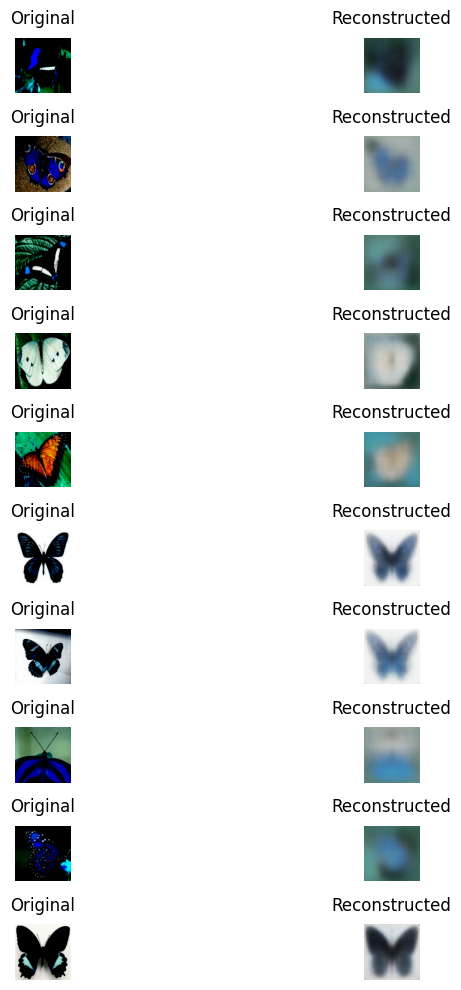

In [26]:
#Get a random batch of size 10 from the dataset
indices = random.sample(range(len(train_dataset)), 10)
data_batch = train_dataset[indices][0]
model_path = '/home/siddharth/siddharth/ADRL/Assignment 2/Models/q1_vae_bf_t1/vae_349.pth'
plot_latent_posterior(data_batch, model_path)

In [27]:
class MLP_classifier(nn.Module):
    def __init__(self, z_dim, num_classes):
        super(MLP_classifier, self).__init__()
        self.fc1 = nn.Linear(z_dim, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, num_classes)
        self.softmax = nn.Softmax(dim=1)
    def forward(self, x):
        x = F.leaky_relu(self.fc1(x))
        x = F.leaky_relu(self.fc2(x))
        x = self.fc3(x)
        x = self.softmax(x)
        return x

In [36]:
def train_MLP_classifier(**kwargs):
    train_dataset = kwargs.get('train_dataset', None)
    if(train_dataset is None):
        raise ValueError("train_dataset is required")
    vae_model = kwargs.get('model', None)
    if(vae_model is None):
        raise ValueError("VAE model is required")
    num_classes = kwargs.get('num_classes', 2)
    z_dim = vae_model.z_dim
    batch_size = kwargs.get('batch_size', 128)
    train_epoch = kwargs.get('train_epoch', 40)
    lr = kwargs.get('lr', 0.0005)
    device = kwargs.get('device', 'cuda')
    save_after = kwargs.get('save_after', 10)
    loss_file = kwargs.get('loss_file_path', None)
    model_path = kwargs.get('model_save_path', None)


    if not os.path.exists(model_path):
        os.makedirs(model_path)
    with open(loss_file, 'w') as f:
            f.write(f'Epoch \t Loss\n')
    
    mlp_classifier = MLP_classifier(z_dim, num_classes).to(device)
    mlp_classifier.train()
    mlp_optimizer = optim.Adam(mlp_classifier.parameters(), lr=lr, betas=(0.5, 0.999), weight_decay=1e-5)
    criterion = nn.CrossEntropyLoss()
    losses = []
    for epoch in range(train_epoch):
        mlp_classifier.train()
        loss = 0
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        tqdm_batch = tqdm(train_loader, desc=f'MLP training: Epoch {epoch}/{train_epoch}')
        total_pred = 0
        correct_pred = 0
        for data, labels in tqdm_batch:
            data = data.to(device)
            labels = torch.tensor(labels).to(device)
            z = latent_posterior_computation(vae_model, data)
            mlp_optimizer.zero_grad()
            output = mlp_classifier(z)
            loss = criterion(output, labels)
            loss.backward()
            mlp_optimizer.step()
            loss += loss.item()
            total_pred += labels.size(0)
            _, predicted = torch.max(output.data, 1)
            correct_pred += (predicted == labels).sum().item()
            tqdm_batch.set_postfix(loss=loss, accuracy=correct_pred/total_pred * 100.)
        print(f'Epoch {epoch}/{train_epoch} Loss: {loss} Accuracy: {correct_pred/total_pred * 100.}')
        losses.append(loss)
        with open(loss_file, 'a') as f:
            f.write(f'{epoch} \t {loss:.4f}\n')
        if (epoch + 1) % save_after == 0:
            torch.save(mlp_classifier, f'{model_path}/MLP_{epoch}.pth')
    return mlp_classifier


In [37]:
#Split the dataset into train and validation
train_size = int(0.8 * len(train_dataset))
test_size = len(train_dataset) - train_size
train_dataset_butterfly, test_dataset_butterfly = random_split(train_dataset, [train_size, test_size])

In [ ]:
#Sample usage
args = {'train_dataset': train_dataset_butterfly,
        'model': torch.load("/home/siddharth/siddharth/ADRL/Assignment 2/Models/q1_vae_bf_t1/vae_349.pth"),
        'num_classes': 75,
        'batch_size': 128,
        'train_epoch': 50,
        'lr': 0.001,
        'device': 'cuda',
        'save_after': 10,
        'model_save_path': "/home/siddharth/siddharth/ADRL/Assignment 2/Models/q3_MLP",
        'loss_file_path':"/home/siddharth/siddharth/ADRL/Assignment 2/Losses/q3_MLP/loss.txt"
        }
mlp_trained = train_MLP_classifier(**args)

In [39]:
def model_evaluation_MLP(model, vae_model, test_dataset, batch_size=16, device='cuda'):
    model = model.to(device)
    latent_model = vae_model
    latent_model = latent_model.to(device)
    model.eval()
    latent_model.eval()

    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    total_correct = 0
    num_data = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        tqdm_test = tqdm(test_loader, desc="Testing")
        for batch in tqdm_test:
            images, labels = batch[0].to(device), batch[1].to(device)
            z = latent_posterior_computation(latent_model, images)
            output = model(z)
            
            # Collect predictions and true labels for F1-score
            preds = output.argmax(1)
            all_preds.extend(preds.cpu().numpy())  
            all_labels.extend(labels.cpu().numpy())  

            total_correct += (preds == labels).sum().item()
            num_data += labels.size(0)
            accuracy = (total_correct / num_data) * 100
            tqdm_test.set_postfix(accuracy=accuracy)
        
    # Calculate F1-score for the entire dataset (micro averaging)
    f1 = f1_score(all_labels, all_preds, average='micro')  

    print(f"Test Accuracy: {accuracy:.2f}%")
    print(f"Test F1 Score (Micro): {f1:.2f}")

In [41]:
vae_model = torch.load("/home/siddharth/siddharth/ADRL/Assignment 2/Models/q1_vae_bf_t1/vae_349.pth")
model_evaluation_MLP(mlp_trained, vae_model, test_dataset_butterfly, batch_size=16, device='cuda')

/tmp/ipykernel_256521/707636511.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae_model = torch.load("/home/siddharth/siddharth/ADRL/Assignment 2/Models/q1_vae_bf_t1/v

Test Accuracy: 23.08%
Test F1 Score (Micro): 0.23


### 6. Beta-VAE (Q.4)

#### a. Architecture

In [43]:
class VAE(nn.Module):
    def __init__(self, z_dim, layer_count=3, channels=3, d=128, mul=1):
        super(VAE, self).__init__()

        
        self.d = d
        self.z_dim = z_dim

        self.layer_count = layer_count

        # Encoder Network
        self.mul = mul
        inputs = channels
        for i in range(self.layer_count):
            setattr(self, "conv%d" % (i + 1), nn.Conv2d(inputs, self.d * self.mul, 4, 2, 1))
            setattr(self, "conv%d_bn" % (i + 1), nn.BatchNorm2d(self.d * self.mul))
            inputs = self.d * self.mul
            self.mul *= 2

        self.d_max = inputs

        self.fc1 = nn.Linear(inputs * 4 * 4, self.z_dim)
        self.fc2 = nn.Linear(inputs * 4 * 4, self.z_dim)

        # Decoder Network
        self.d1 = nn.Linear(self.z_dim, inputs * 4 * 4)

        self.mul = inputs // self.d // 2

        for i in range(1, self.layer_count):
            setattr(self, "deconv%d" % (i + 1), nn.ConvTranspose2d(inputs, self.d * self.mul, 4, 2, 1))
            setattr(self, "deconv%d_bn" % (i + 1), nn.BatchNorm2d(self.d *self. mul))
            inputs = self.d * self.mul
            self.mul //= 2

        setattr(self, "deconv%d" % (self.layer_count + 1), nn.ConvTranspose2d(inputs, channels, 4, 2, 1))

    def encode(self, x):
        for i in range(self.layer_count):
            x = F.relu(getattr(self, "conv%d_bn" % (i + 1))(getattr(self, "conv%d" % (i + 1))(x)))

        x = x.view(x.shape[0], self.d_max * 4 * 4)
        mu = self.fc1(x)
        logvar = self.fc2(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        if self.training:
            std = torch.exp(0.5 * logvar)
            eps = torch.randn_like(std)
            return eps.mul(std).add_(mu)
        else:
            return mu

    def decode(self, x):
        x = x.view(x.shape[0], self.z_dim)
        x = self.d1(x)
        x = x.view(x.shape[0], self.d_max, 4, 4)
        #x = self.deconv1_bn(x)
        x = F.leaky_relu(x, 0.2)

        for i in range(1, self.layer_count):
            x = F.leaky_relu(getattr(self, "deconv%d_bn" % (i + 1))(getattr(self, "deconv%d" % (i + 1))(x)), 0.2)

        x = F.tanh(getattr(self, "deconv%d" % (self.layer_count + 1))(x))
        return x

    def forward(self, x):
        mu, logvar = self.encode(x)
        mu = mu.squeeze()
        logvar = logvar.squeeze()
        z = self.reparameterize(mu, logvar)
        return self.decode(z.view(-1, self.z_dim, 1, 1)), mu, logvar

    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)


def normal_init(m, mean, std):
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()

#### b. Training Loop 

In [ ]:
def loss_function(recon_x, x, mu, logvar, beta):
    MSE = torch.mean((recon_x - x)**2)

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    
    KLD = -0.5 * torch.mean(torch.mean(1 + logvar - mu.pow(2) - logvar.exp(), 1))
    return MSE, KLD * beta


def train(**kwargs): 
    z_dim = kwargs.get('z_dim', 128)
    batch_size = kwargs.get('batch_size', 128)
    train_epoch = kwargs.get('train_epoch', 40)
    model_path = kwargs.get('pretrained_model_path', None)
    lr = kwargs.get('lr', 0.0005)
    layer_count = kwargs.get('layer_count', 5)
    device = kwargs.get('device', 'cuda')
    train_data = kwargs.get('train_data', None)
    save_after = kwargs.get('save_after', 10)
    loss_file_path = kwargs.get('loss_file_path', None)
    model_file_path = kwargs.get('model_file_path', None)
    scaling_factor = kwargs.get('scaling_factor', 0.2)
    fid_file_path = kwargs.get('fid_file_path', None)
    
    if not os.path.exists(loss_file_path):
        os.makedirs(loss_file_path)
    if not os.path.exists(model_file_path):
        os.makedirs(model_file_path)
    
    if train_data is None:
        raise ValueError("train_data is required")
    
    with open(loss_file_path, 'w') as f:
        f.write(f'Epoch \t Rec_Loss \t KL_Loss \t Combined_Loss\n')
        
    if model_path is None :
        vae = VAE(z_dim=z_dim, layer_count=layer_count)
        vae.weight_init(mean=0.0, std=0.02)
    else:
        vae = torch.load(model_path)

    vae = vae.to(device)
    vae.train()

    vae_optimizer = optim.Adam(vae.parameters(), lr=lr, betas=(0.5, 0.999), weight_decay=1e-5)

    for epoch in range(train_epoch):
        
        # epoch = epoch + 2000
        vae.train()
        rec_loss = 0
        kl_loss = 0
        combined_loss = 0

        if (epoch + 1) % 8 == 0:
            vae_optimizer.param_groups[0]['lr'] /= 4
            print("learning rate change!")
        train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
        tqdm_batch = tqdm(train_loader, desc=f'VAE training: Epoch {epoch}/{train_epoch}')
        for data, _ in tqdm_batch:
            data = data.to(device)
            vae_optimizer.zero_grad()
            rec, mu, logvar = vae(data)

            loss_re, loss_kl = loss_function(rec, data, mu, logvar, scaling_factor)
            # print("loss_re", loss_re)
            # print("loss_re", loss_kl)
            if(scaling_factor == 0):
                loss_re.backward()
                rec_loss += loss_re.item()
            else:
                (loss_re + loss_kl).backward()
                rec_loss += loss_re.item()
                kl_loss += loss_kl.item()
            vae_optimizer.step()
            
            tqdm_batch.set_postfix(rec_loss=rec_loss, kl_loss=kl_loss)
        print(f'Epoch {epoch}/{train_epoch} Loss: {combined_loss}')
 
        combined_loss = rec_loss + kl_loss
        if(kl_loss != 0 and scaling_factor != 0):
            kl_loss = kl_loss/scaling_factor
        
        if (epoch + 1) % save_after == 0:
            torch.save(vae, f'/home/siddharth/siddharth/ADRL/Assignment 2/Models/vanilla_vae_4/vae_{epoch}.pth')
          
        with open(loss_file_path, 'a') as f:
            f.write(f'{epoch} \t {rec_loss:.4f} \t {kl_loss:.4f} \t {combined_loss:.4f}\n')
        
        with open(fid_file_path,'a') as f:
            fid_score = compute_fid(vae, data_folder_aug_animals, z_dim)
            f.write(f"Epoch {epoch}, FID Score: {fid_score}\n")
            f.flush()

            

##### i. Animal Train

In [ ]:
args = {'z_dim': 512,
        'batch_size': 128,
        'train_epoch': 400,
        'pretrained_model_path': None,
        'lr': 0.0005,
        'layer_count': 5,
        'device': 'cuda',
        'train_data': train_dataset,
        'save_after': 50,
        'loss_file_path':"",
        'model_file_path':"",
        'beta':2,
        'fid_file_path':""
        }

##### ii. Butterfly Train

In [ ]:
args = {'z_dim': 512,
        'batch_size': 128,
        'train_epoch': 400,
        'pretrained_model_path': None,
        'lr': 0.0005,
        'layer_count': 5,
        'device': 'cuda',
        'train_data': train_dataset_butterfly,
        'save_after': 50,
        'loss_file_path':"",
        'model_file_path':"",
        'beta':2,
        'fid_file_path':""
        }

#### c. Inference and Results

In [52]:
def plot_img_vae(model_path, z_dim, layer_count,num_images=10, device = "cpu"):
    vae = torch.load(model_path)
    vae.to(device)
    vae.eval()

    fig, axes = plt.subplots(num_images, num_images, figsize=(10, 10))

    with torch.no_grad():  
        for i in range(num_images):
            for j in range(num_images):
                z = torch.randn(1,z_dim)
                # logvar = torch.log(torch.randn(1, z_dim))  
                
                # z = vae.reparameterize(mu,logvar)

                img = vae.decode(z.view(1, z_dim, 1, 1))  
                
                img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  
                img = (img + 1) * 127.5  
                img = img.astype(np.uint8)  

                axes[i, j].imshow(img)
                axes[i, j].axis('off')  

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

def plot_img_with_enc(model_path, z_dim, layer_count, img, device="cpu"):
    vae = torch.load(model_path)
    vae.to(device)
    vae.eval()  
    with torch.no_grad():
        if img.dim() == 3:  
            img = img.unsqueeze(0)  
        
        rec, mu, logvar = vae(img)
       
        rec = rec.squeeze(0).permute(1, 2, 0).cpu().numpy()  
        rec = (rec + 1) * 127.5  
        rec = rec.astype(np.uint8)  

        
        plt.imshow(rec)
        plt.axis('off') 
        plt.show()

def plot_losses(loss_file):
    epochs = []
    rec_losses = []
    kl_losses = []
    combined_losses = []

    with open(loss_file, 'r') as f:
        next(f)
        for line in f:
            epoch, rec_loss, kl_loss, combined_loss = map(float, line.split())
            epochs.append(epoch)
            rec_losses.append(rec_loss)
            kl_losses.append(kl_loss)
            combined_losses.append(combined_loss)

    
    epochs = np.array(epochs)
    rec_losses = np.array(rec_losses)
    kl_losses = np.array(kl_losses)
    combined_losses = np.array(combined_losses)

    plt.figure(figsize=(12, 6))
    plt.plot(epochs, rec_losses, label='Reconstruction Loss', color='blue', marker='o')
    plt.plot(epochs, kl_losses, label='KL Divergence Loss', color='orange', marker='o')
    plt.plot(epochs, combined_losses, label='Combined Loss', color='green', marker='o')

    plt.title('Loss Curves for VAE Training')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    plt.ylim(0, 20) 
    plt.legend()
    plt.grid()
    plt.show()

def calculate_fid(real_images, generated_images, batch_size=32, device='cuda'):
    
    model = inception_v3(pretrained=True, transform_input=False).to(device)
    model.fc = nn.Identity()  
    model.eval()  
    act1 = get_activations(real_images, model, batch_size, device)
    act2 = get_activations(generated_images, model, batch_size, device)
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    fid_score = calculate_frechet_distance(mu1, sigma1, mu2, sigma2)
    return fid_score

def get_activations(images, model, batch_size, device):
    dataloader = DataLoader(images, batch_size=batch_size, shuffle=False)
    activations = []

    with torch.no_grad():
        for batch in dataloader:
            batch = batch.to(device)
            pred = model(batch)
            activations.append(pred.cpu().numpy())
    
    activations = np.concatenate(activations, axis=0)
    return activations

def preprocess_images(images, image_size=(299, 299)):
    preprocess = transforms.Compose([
        transforms.Resize(image_size),
        transforms.Lambda(lambda x: (x + 1) / 2), 
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    processed_images = [preprocess(img) for img in images]
    return torch.stack(processed_images)


def calculate_frechet_distance(mu1, sigma1, mu2, sigma2):
    diff = mu1 - mu2
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean)
    
    return fid

def compute_fid(model,data_loc, z_dim):
    test_dataset = AnimalsDataset(data_loc)
    
    sample_indices = random.sample(range(len(test_dataset)), 1000)
    sample_images = [test_dataset[i][0] for i in sample_indices]
    
    with torch.no_grad():
        z = torch.randn(1000, z_dim)
        img = model.decode(z.view(1000, z_dim, 1, 1))
        
    img_list = [img[i] for i in range(1000)]
    img_list[0].shape
        
    preprocessed_real_images = preprocess_images(sample_images)
    preprocessed_generated_images = preprocess_images(img_list)
    
    fid_score = calculate_fid(preprocessed_real_images, preprocessed_generated_images)
    return fid_score

def plot_losses_beta(loss_file):
    epochs = []
    rec_losses = []
    kl_losses = []
    combined_losses = []

    with open(loss_file, 'r') as f:
        next(f)
        for line in f:
            epoch, rec_loss, kl_loss, combined_loss = map(float, line.split())
            epochs.append(epoch)
            rec_losses.append(rec_loss)
            kl_losses.append(kl_loss)
            combined_losses.append(combined_loss)

    
    epochs = np.array(epochs)
    rec_losses = np.array(rec_losses)
    kl_losses = np.array(kl_losses)
    combined_losses = np.array(combined_losses)

    plt.figure(figsize=(12, 6))
    plt.plot(epochs, rec_losses, label='Reconstruction Loss', color='blue', marker='o')
    plt.plot(epochs, kl_losses, label='KL Divergence Loss', color='orange', marker='o')
    plt.plot(epochs, combined_losses, label='Combined Loss', color='green', marker='o')

    plt.title('Loss Curves for VAE Training')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    plt.ylim(0, 100) 
    plt.legend()
    plt.grid()
    plt.show()

def plot_fid_scores(file_path):
    epochs = []
    fid_scores = []

    with open(file_path, 'r') as f:
        lines = f.readlines()

        for line in lines:
            if "Epoch" in line and "FID Score" in line:
                parts = line.split(',')
                epoch_part = parts[0].strip().split(" ")[1]
                fid_part = parts[1].strip().split(":")[1]

                epochs.append(int(epoch_part))
                fid_scores.append(float(fid_part))

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, fid_scores, marker='o', linestyle='-', color='b', label='FID Score')
    plt.xlabel('Epochs')
    plt.ylabel('FID Score')
    plt.title('FID Score vs. Epochs')
    plt.grid(True)
    plt.legend()
    plt.show()

##### BUTTERFLY_DATASET

###### Try 1: 

Hyperparameters: 

'z_dim': 512,

'batch_size': 128,

'train_epoch': 400,

'lr': 0.0005,

'layer_count': 5,

'scaling_factor':2,

/tmp/ipykernel_115028/926928620.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load(model_path)


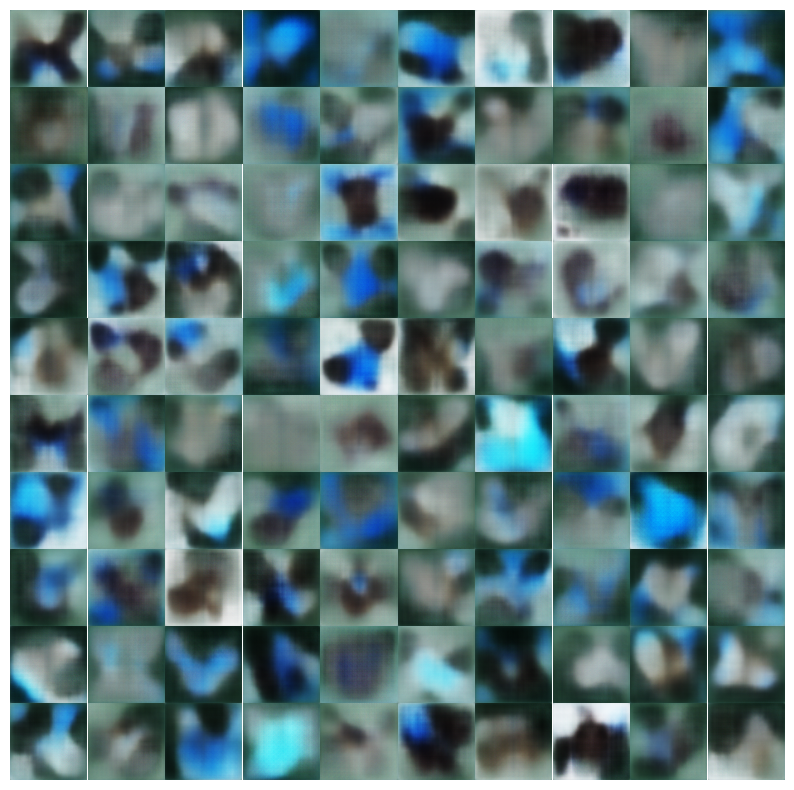

In [22]:
model_path = "//home/siddharth/siddharth/ADRL/Assignment 2/Models/q4_bvae/vae_399.pth"

z_dim = 512  
layer_count = 5

plot_img_vae(model_path, z_dim, layer_count, num_images=10)

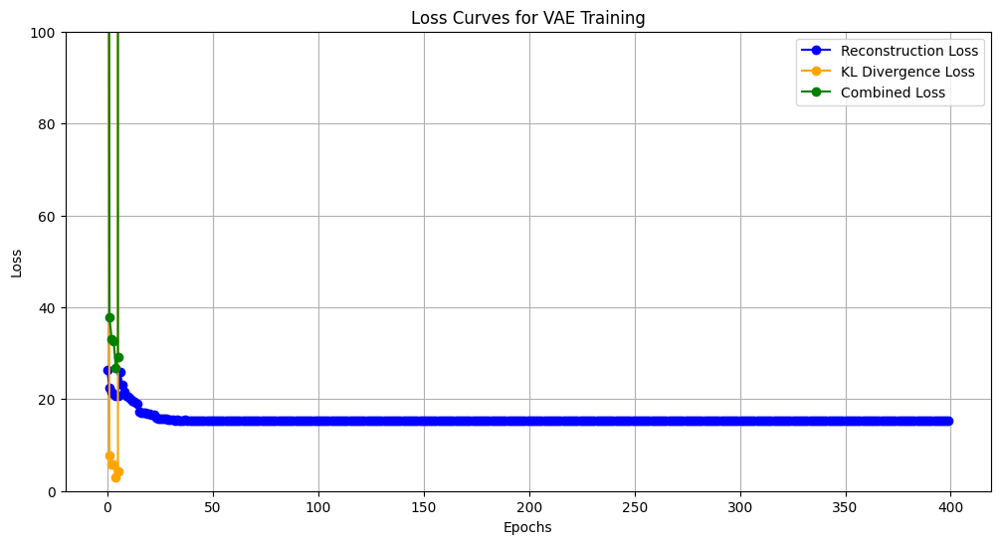

In [15]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Losses/q4_bvae/t1.txt"
plot_losses_beta(loss_file_path)

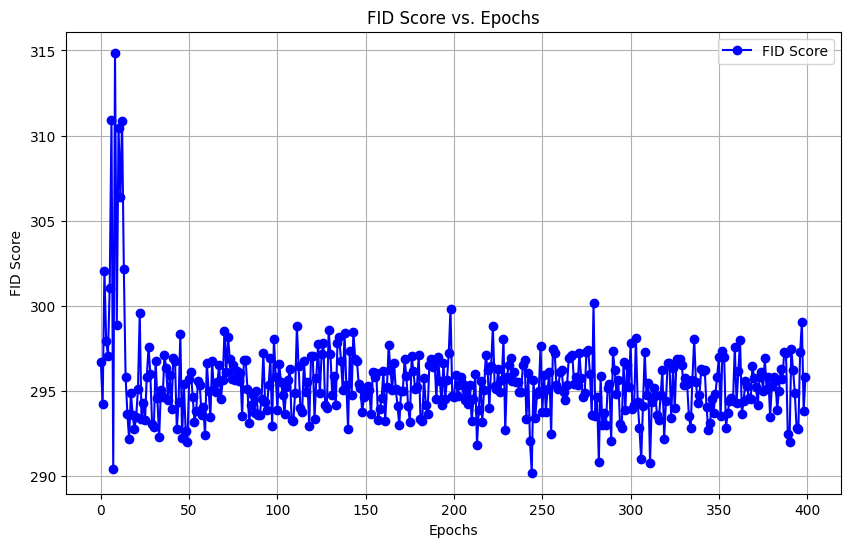

In [9]:
plot_fid_scores("/home/siddharth/siddharth/ADRL/Assignment 2/FIDs/q4_bvae/t1.txt")


###### Try 2: 

Hyperparameters: 

'z_dim': 512,

'batch_size': 128,

'train_epoch': 400,

'lr': 0.0005,

'layer_count': 5,

'scaling_factor':3,

/tmp/ipykernel_279939/1623722721.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load(model_path)


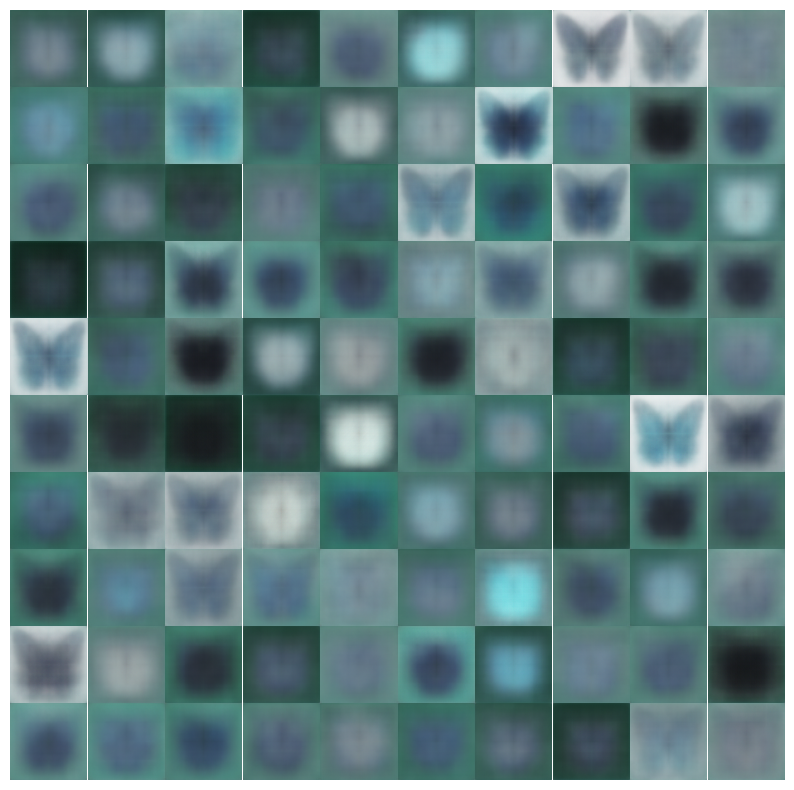

In [187]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/q4_bvae/q4_t2/vae_1399.pth"

z_dim = 512  
layer_count = 5

plot_img_vae(model_path, z_dim, layer_count, num_images=10)

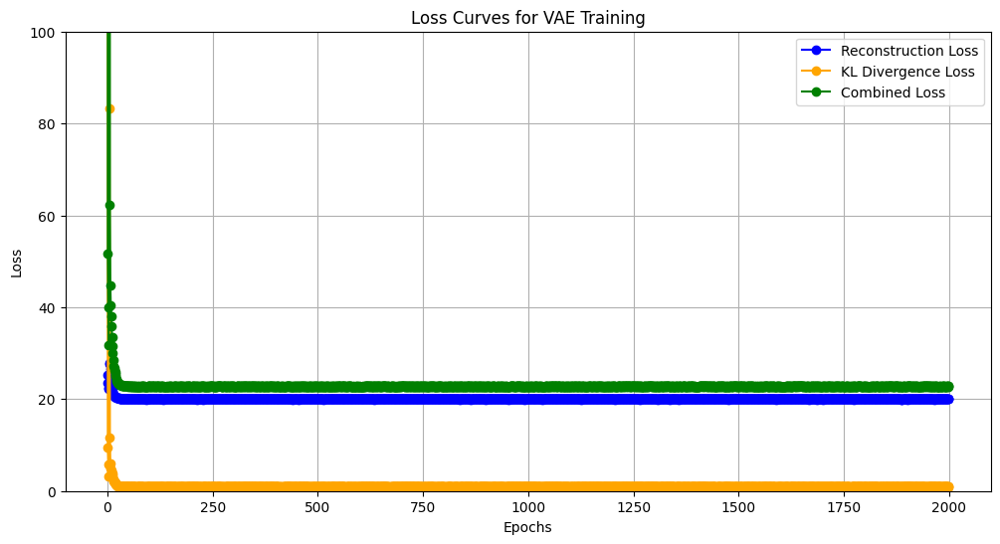

In [46]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Losses/q4_bvae/t2.txt"
plot_losses_beta(loss_file_path)

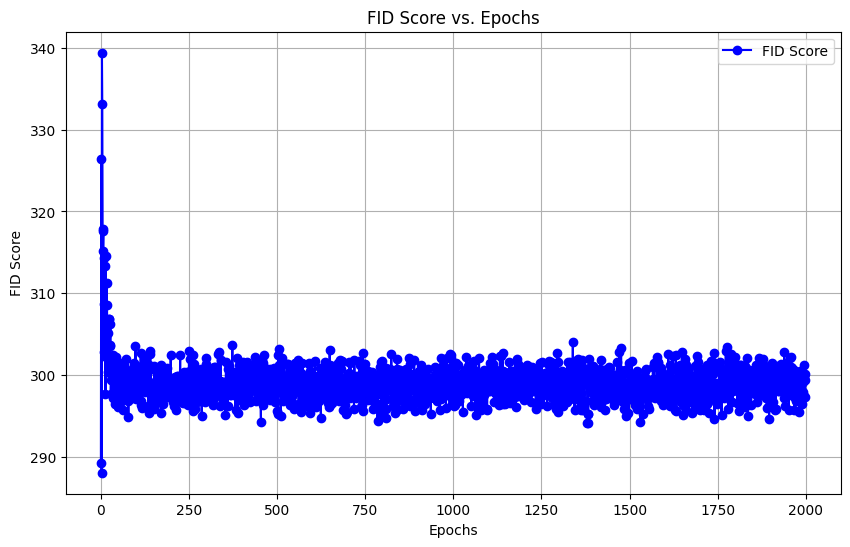

In [51]:
plot_fid_scores("/home/siddharth/siddharth/ADRL/Assignment 2/FIDs/q4_bvae/t2.txt")

### 7. Beta-VAE-Posterior Inference (Q.5)

In [42]:
def linear_interpolation(z1, z2, steps=10):
    z = torch.zeros(steps, z1.size(0))
    for i, alpha in enumerate(np.linspace(0, 1, steps)):
        z[i] = alpha * z1 + (1 - alpha) * z2
    return z

In [43]:
def plot_linear_traversal(vae_model, train_data, device='cuda'):
    vae_model = vae_model.to(device)
    vae_model.eval()
    fig, axes = plt.subplots(10, 12, figsize=(10, 12))
    for i in range(10):
        #Sample two random images from the dataset
        idx1 = random.randint(0, len(train_data))
        idx2 = random.randint(0, len(train_data))
        img1, _ = train_data[idx1]
        img2, _ = train_data[idx2]
        img1 = img1.unsqueeze(0).to(device)
        img2 = img2.unsqueeze(0).to(device)
        z1 = latent_posterior_computation(vae_model, img1)
        z2 = latent_posterior_computation(vae_model, img2)
        z1 = z1.squeeze()
        z2 = z2.squeeze()
        z = linear_interpolation(z2, z1, steps=10)
        z = z.to(device)
        with torch.no_grad():
            output = vae_model.decode(z.view(-1, vae_model.z_dim, 1, 1))
        
        
        for j in range(12):
           if(j == 0):
               img = img1.squeeze().permute(1, 2, 0).cpu().numpy()
               img = (img + 1) * 127.5
               img = img.astype(np.uint8)
               img = img[..., ::-1]
               
           elif(j<=10): 
                img = output[j-1].permute(1, 2, 0).cpu().numpy()
                img = (img + 1) * 127.5
                img = img.astype(np.uint8)
                #print(img)
                img = img[..., ::-1]
                #print(img)
           else:
                img = img2.squeeze().permute(1, 2, 0).cpu().numpy()
                img = (img + 1) * 127.5
                img = img.astype(np.uint8)
                img = img[..., ::-1]
               
           axes[i, j].imshow(img)
           axes[i, j].axis('off')
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()
        

In [44]:
vae_model = torch.load('/home/siddharth/siddharth/ADRL/Assignment 2/Models/q1_vae_bf_t1/vae_199.pth')

/tmp/ipykernel_256521/1542171754.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae_model = torch.load('/home/siddharth/siddharth/ADRL/Assignment 2/Models/q1_vae_bf_t1/

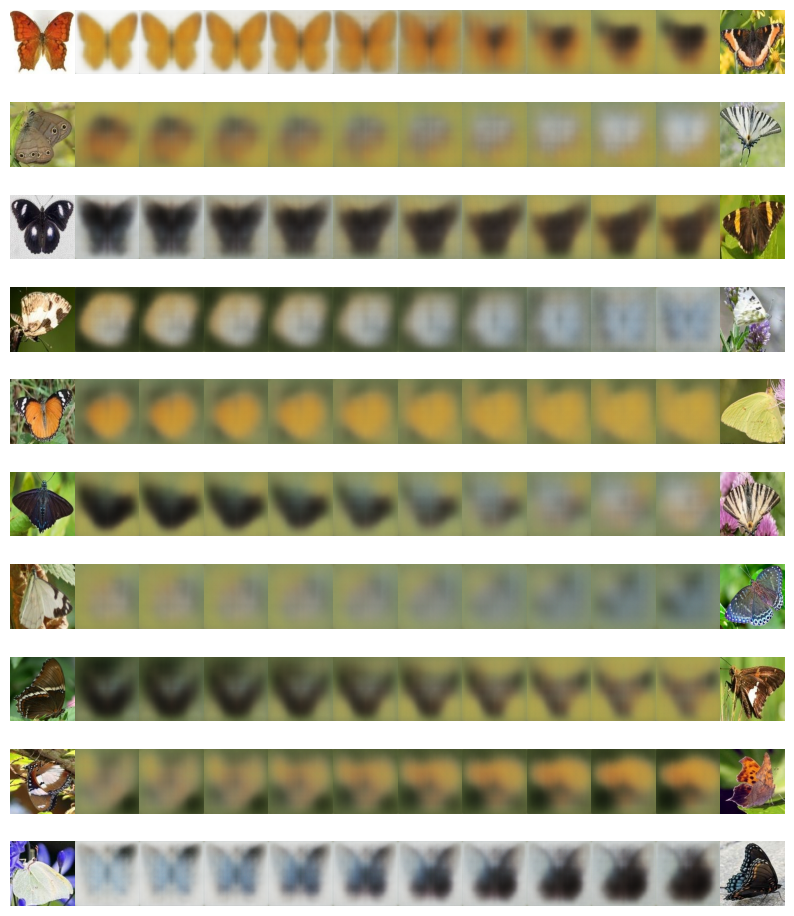

In [46]:
plot_linear_traversal(vae_model, train_dataset_butterfly, device='cuda')

### 8. Adversarial Auto-Encoder with MSE Loss (Q.6)

In [5]:
class Discriminator(nn.Module):
    def __init__(self, z_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(z_dim, 256)
        self.fc2 = nn.Linear(256, 256)
        self.fc3 = nn.Linear(256,1)

    def forward(self, z):
        z = F.relu(self.fc1(z))
        z = F.relu(self.fc2(z))
        return torch.sigmoid(self.fc3(z))

class AAE(nn.Module):
    def __init__(self, z_dim=128, layer_count=3, channels=3, d=128, mul=1):
        super(AAE, self).__init__()
        
        self.d = d
        self.z_dim = z_dim
        print(self.z_dim)
        self.layer_count = layer_count

        # Encoder Network
        self.mul = mul
        inputs = channels
        for i in range(self.layer_count):
            setattr(self, "conv%d" % (i + 1), nn.Conv2d(inputs, self.d * self.mul, 4, 2, 1))
            setattr(self, "conv%d_bn" % (i + 1), nn.BatchNorm2d(self.d * self.mul))
            inputs = self.d * self.mul
            self.mul *= 2

        self.d_max = inputs
        self.fc = nn.Linear(inputs * 4 * 4, self.z_dim)

        # Decoder Network
        self.d1 = nn.Linear(self.z_dim, inputs * 4 * 4)
        self.mul = inputs // self.d // 2

        for i in range(1, self.layer_count):
            setattr(self, "deconv%d" % (i + 1), nn.ConvTranspose2d(inputs, self.d * self.mul, 4, 2, 1))
            setattr(self, "deconv%d_bn" % (i + 1), nn.BatchNorm2d(self.d *self. mul))
            inputs = self.d * self.mul
            self.mul //= 2

        setattr(self, "deconv%d" % (self.layer_count + 1), nn.ConvTranspose2d(inputs, channels, 4, 2, 1))

        self.discriminator = Discriminator(z_dim)

    def encode(self, x):
        for i in range(self.layer_count):
            x = F.relu(getattr(self, "conv%d_bn" % (i + 1))(getattr(self, "conv%d" % (i + 1))(x)))
        x = x.view(x.shape[0], self.d_max * 4 * 4)
        z = self.fc(x)
        return z

    def decode(self, z):
        x = z.view(z.shape[0], self.z_dim)
        x = self.d1(x)
        x = x.view(x.shape[0], self.d_max, 4, 4)
        x = F.leaky_relu(x, 0.2)

        for i in range(1, self.layer_count):
            x = F.leaky_relu(getattr(self, "deconv%d_bn" % (i + 1))(getattr(self, "deconv%d" % (i + 1))(x)), 0.2)

        x = F.tanh(getattr(self, "deconv%d" % (self.layer_count + 1))(x))
        return x

    def forward(self, x):
        z = self.encode(x)

        return self.decode(z)
    
    def discriminator_output(self, z):
        return self.discriminator(z)

    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

def normal_init(m, mean, std):
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()

In [44]:
z_dim = 256  # Example latent dimension
aae_model = AAE(z_dim=z_dim, layer_count=5, channels=3)

input_data = torch.randn((8, 3, 128, 128)) 
print(input_data.shape) # Example batch of images
reconstructed_images = aae_model(input_data)

256
torch.Size([8, 3, 128, 128])


In [24]:
def train_aae(aae_model, discriminator, train_data, num_epochs=100, lr=0.0002, z_dim=128, batch_size = 64,device='cuda', save_after=100, model_file_path = None, loss_file_path = None, fid_file_path = None):
    # Optimizers for both the AAE and the discriminator
    optimizer_aae = optim.Adam(aae_model.parameters(), lr=lr)
    optimizer_discriminator = optim.Adam(discriminator.parameters(), lr=lr)
    
    reconstruction_criterion = nn.MSELoss()  # Could be nn.BCELoss() or nn.L1Loss() as well
    adversarial_criterion = nn.BCELoss()     # For the adversarial loss

    aae_model = aae_model.to(device)
    discriminator = discriminator.to(device)
    real_label, fake_label = 1, 0


    if not model_file_path or not loss_file_path:
        raise ValueError("model_file_path or loss_file_path is required")
    

    with open(loss_file_path, 'w') as f:
        f.write(f'Epoch \t Recon_Loss \t Discriminator_Loss \t Generator_Loss\n')

    for epoch in range(num_epochs):
        aae_model.train()
        total_recon_loss = 0
        total_discriminator_loss = 0
        total_generator_loss = 0

        # Loop through batches in the dataset

        train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
        tqdm_batch = tqdm(train_loader, desc=f'AAE training: Epoch {epoch}/{num_epochs}')
       
        for batch,_ in tqdm_batch:
            inputs = batch.to(device)
            batch_size = inputs.size(0)

            # Phase 1: Reconstruction Phase
            optimizer_aae.zero_grad()

            z_encoded = aae_model.encode(inputs)
            recon_images = aae_model.decode(z_encoded)
            recon_loss = reconstruction_criterion(recon_images, inputs)

            # Backpropagation for the AAE (encoder + decoder)
            recon_loss.backward()
            optimizer_aae.step()

            total_recon_loss += recon_loss.item()

            # Phase 2: Regularization Phase (Adversarial Training)

            # Train Discriminator
            optimizer_discriminator.zero_grad()

            # Real latent vectors (sampled from normal distribution)
            z_real = torch.randn(batch_size, z_dim).to(device)
            real_output = discriminator(z_real)
            real_loss = adversarial_criterion(real_output, torch.ones_like(real_output) )

            # Fake latent vectors (encoded by the encoder)
            z_fake = aae_model.encode(inputs).detach()  # Detach so we don't update encoder here
            fake_output = discriminator(z_fake)
            fake_loss = adversarial_criterion(fake_output, torch.zeros_like(fake_output))

            # Total loss for the discriminator
            discriminator_loss = real_loss + fake_loss
            discriminator_loss.backward()
            optimizer_discriminator.step()

            total_discriminator_loss += discriminator_loss.item()

            # Train Encoder (Generator in Adversarial Training)
            optimizer_aae.zero_grad()

            z_fake = aae_model.encode(inputs)  # Get latent vectors again
            fake_output = discriminator(z_fake)
            generator_loss = adversarial_criterion(fake_output, torch.ones_like(fake_output))

            # Backpropagation for the encoder (generator loss)
            generator_loss.backward()
            optimizer_aae.step()

            total_generator_loss += generator_loss.item()

        # Print losses for the epoch
        print(f"Epoch {epoch}/{num_epochs}, Recon Loss: {total_recon_loss/len(train_loader):.4f}, "
              f"Discriminator Loss: {total_discriminator_loss/len(train_loader):.4f}, "
              f"Generator Loss: {total_generator_loss/len(train_loader):.4f}")
        
        if (epoch + 1) % save_after == 0:
            torch.save(aae_model, f'{model_file_path}/aae_{epoch}.pth')
        
        with open(loss_file_path, 'a') as f:
            f.write(f'{epoch} \t {total_recon_loss/len(train_loader):.4f} \t {total_discriminator_loss/len(train_loader):.4f} \t {total_generator_loss/len(train_loader):.4f}\n')

        with open(fid_file_path,'a') as f:
            fid_score = compute_fid(aae_model, data_folder_aug_butterfly, z_dim)
            f.write(f"Epoch {epoch}, FID Score: {fid_score}\n")
            f.flush()
        

In [25]:
aae_model = AAE(z_dim=128, layer_count=5, channels=3)
aae_model.weight_init(mean = 0.0, std = 0.02)

num_epochs = 100
lr = 0.0002
z_dim = 128
batch_size = 64
device = "cuda"
save_after = 1
model_file_path= "/home/siddharth/siddharth/ADRL/Assignment 2/Models/aae"
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Losses/aae_losses/aae_1.txt"
fid_file_path = "/home/siddharth/siddharth/ADRL/Assignment 2/FIDs/aae/fid_1.txt"
train_dataset_butterfly = ButterflyDataset(data_folder_aug_butterfly) 
disciminator = Discriminator(aae_model.z_dim)
train_aae(aae_model, discriminator=disciminator, train_data = train_dataset_butterfly, num_epochs=num_epochs, lr = lr, z_dim = z_dim, batch_size=batch_size, device = device, save_after=save_after, model_file_path=model_file_path, loss_file_path=loss_file_path, fid_file_path=fid_file_path)

128


AAE training: Epoch 0/100: 100%|██████████| 204/204 [00:26<00:00,  7.76it/s]


Epoch 0/100, Recon Loss: 0.1904, Discriminator Loss: 0.1451, Generator Loss: 0.0035


/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
AAE training: Epoch 1/100: 100%|██████████| 2167/2167 [01:24<00:00, 25.73it/s]


Epoch 1/100, Recon Loss: 0.1285, Discriminator Loss: 0.0804, Generator Loss: 0.0000


/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
AAE training: Epoch 2/100: 100%|██████████| 6499/6499 [03:08<00:00, 34.53it/s]


Epoch 2/100, Recon Loss: 0.1220, Discriminator Loss: 0.0650, Generator Loss: 0.0000


/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
AAE training: Epoch 3/100:  33%|███▎      | 2135/6499 [01:01<02:05, 34.86it/s]


KeyboardInterrupt: 

In [56]:
aae = torch.load("/home/siddharth/siddharth/ADRL/Assignment 2/Models/aae/aae_6.pth")
aae.to("cpu")
fid_score = compute_fid(aae, data_folder_aug_butterfly, 128)       

/tmp/ipykernel_4223/2610338648.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  aae = torch.load("/home/siddharth/siddharth/ADRL/Assignment 2/Models/aae/aae_0.pth")
/home

In [57]:
fid_score

287.8427096716706

#### c. Inference and Results

In [32]:
def plot_losses_aae(loss_file):
    epochs = []
    recon_losses = []
    discriminator_losses = []
    generator_losses = []

    with open(loss_file, 'r') as f:
        next(f)
        for line in f:
            epoch, Recon_losses, Discriminator_losses, Generator_losses = map(float, line.split())
            epochs.append(epoch)
            recon_losses.append(Recon_losses)
            discriminator_losses.append(Discriminator_losses)
            generator_losses.append(Generator_losses)
  
    epochs = np.array(epochs)
    recon_losses = np.array(recon_losses)
    discriminator_losses = np.array(discriminator_losses)
    generator_losses = np.array(generator_losses)

    plt.figure(figsize=(12, 6))
    plt.plot(epochs, recon_losses, label='Reconstruction Loss', color='blue', marker='o')
    plt.plot(epochs, discriminator_losses, label='Discriminator Loss', color='orange', marker='o')
    plt.plot(epochs, generator_losses, label='Generator Loss', color='green', marker='o')

    plt.title('Loss Curves for VAE Training')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    plt.ylim(0, 8) 
    plt.legend()
    plt.grid()
    plt.show()

##### BUTTERFLY_DATASET TRIALS

###### Try 1:  

Hyperparameters are:

'z_size': 128,
 
'batch_size': 64,
  
'train_epoch': 100,
    
'lr': 0.0002,
  
'layer_count': 5,

'scaling_factor' : 1, 

/tmp/ipykernel_3380/1034814420.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load(model_path)


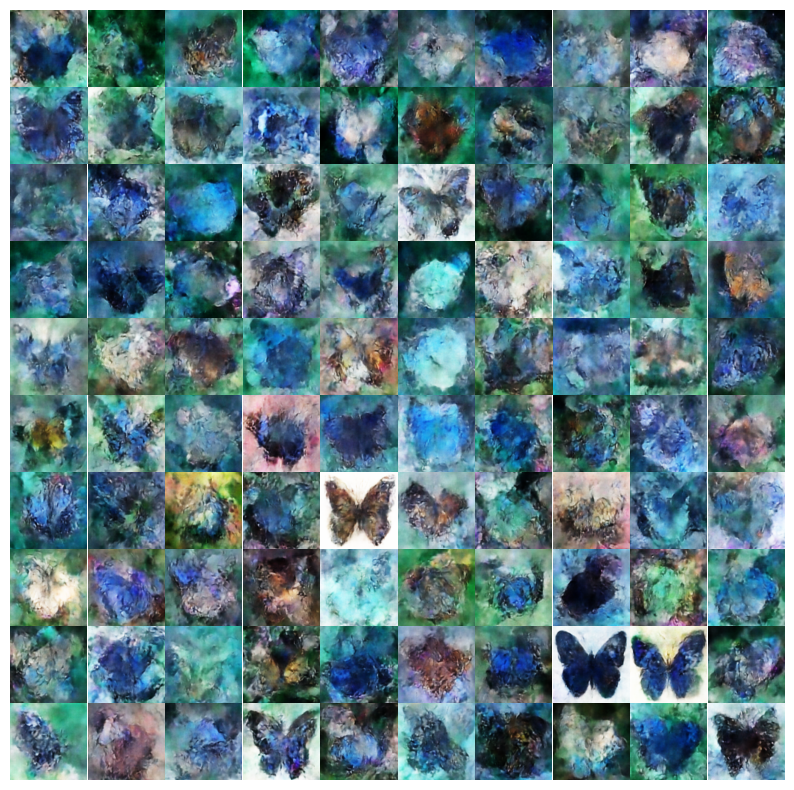

In [15]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/aae/aae_479.pth"

z_dim = 128
layer_count = 5

plot_img_vae(model_path, z_dim, layer_count, num_images=10)

/tmp/ipykernel_3027/1034814420.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae = torch.load(model_path)


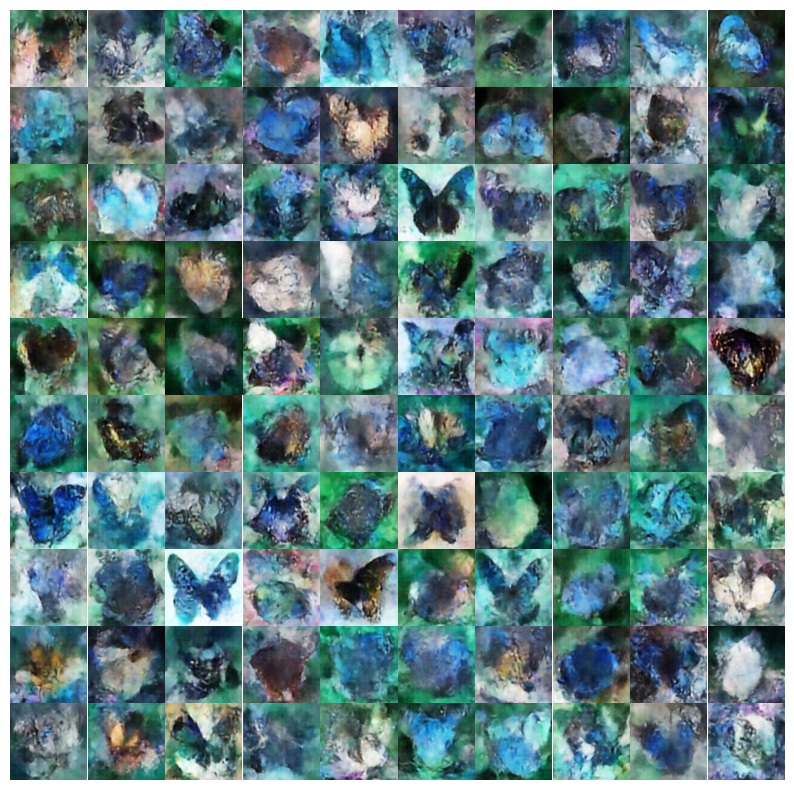

In [54]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/aae/aae_155.pth"

z_dim = 128
layer_count = 5

plot_img_vae(model_path, z_dim, layer_count, num_images=10)

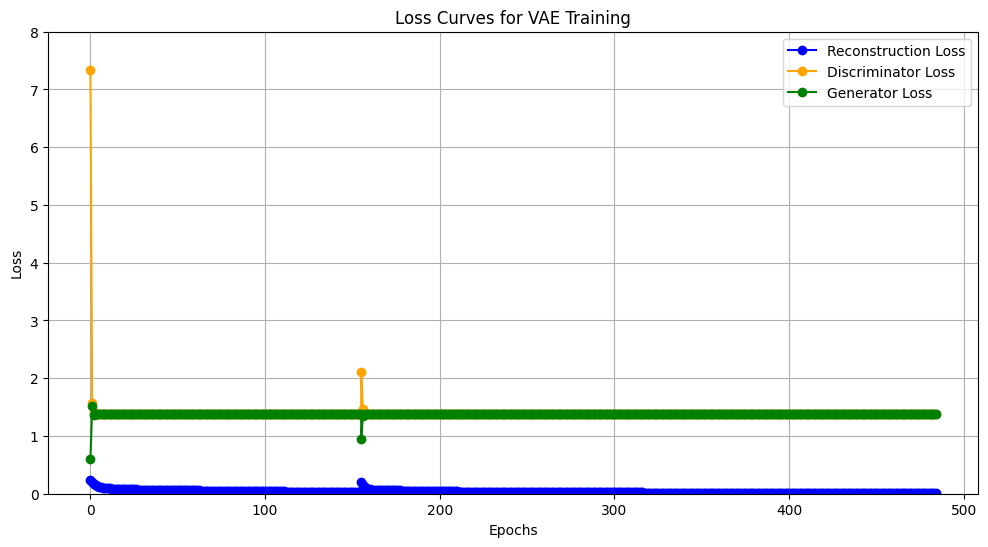

In [33]:
plot_losses_aae("/home/siddharth/siddharth/ADRL/Assignment 2/Losses/q6_aae/aae_1.txt")

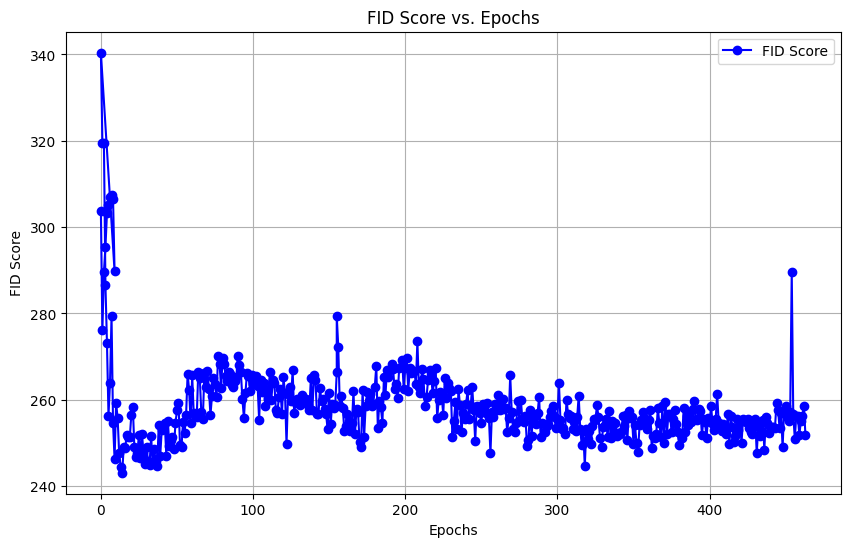

In [8]:
plot_fid_scores("/home/siddharth/siddharth/ADRL/Assignment 2/FIDs/aae/fid_1.txt")

### 9. VQ-VAE (Q.7)

#### a. Implementation

In [2]:
class ResidualLayer(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResidualLayer, self).__init__()
        self.block = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, in_channels, kernel_size=1, stride=1)
        )
    
    def forward(self, x):
        return x + self.block(x)

class ResidualStack(nn.Module):
    def __init__(self, in_channels, res_channels, n_res_layers):
        super(ResidualStack, self).__init__()
        self.layers = nn.ModuleList([ResidualLayer(in_channels, res_channels) for _ in range(n_res_layers)])
    
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return F.relu(x)

class Encoder(nn.Module):
    def __init__(self, in_channels, h_dim, n_res_layers, res_h_dim):
        super(Encoder, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, h_dim // 2, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(h_dim // 2, h_dim, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(h_dim, h_dim, kernel_size=3, stride=1, padding=1)
        self.res_stack = ResidualStack(h_dim, res_h_dim, n_res_layers)
    
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.conv3(x)
        return self.res_stack(x)

class Decoder(nn.Module):
    def __init__(self, h_dim, n_res_layers, res_h_dim, out_channels):
        super(Decoder, self).__init__()
        self.res_stack = ResidualStack(h_dim, res_h_dim, n_res_layers)
        self.conv1 = nn.ConvTranspose2d(h_dim, h_dim // 2, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.ConvTranspose2d(h_dim // 2, out_channels, kernel_size=4, stride=2, padding=1)
    
    def forward(self, x):
        x = self.res_stack(x)
        x = F.relu(self.conv1(x))
        return torch.sigmoid(self.conv2(x))

class VectorQuantizer(nn.Module):
    def __init__(self, n_embeddings, embedding_dim, beta):
        super(VectorQuantizer, self).__init__()
        self.embedding_dim = embedding_dim
        self.n_embeddings = n_embeddings
        self.beta = beta
        
        self.embeddings = nn.Embedding(n_embeddings, embedding_dim)
        self.embeddings.weight.data.uniform_(-1/self.n_embeddings, 1/self.n_embeddings)

    def forward(self, z):
        z_flattened = z.view(-1, self.embedding_dim)
        
        # Compute distances between z and embedding vectors
        distances = torch.sum(z_flattened ** 2, dim=1, keepdim=True) + \
                    torch.sum(self.embeddings.weight ** 2, dim=1) - \
                    2 * torch.matmul(z_flattened, self.embeddings.weight.t())
        
        # Get the closest embedding for each element in z
        indices = torch.argmin(distances, dim=1).unsqueeze(1)
        z_q = torch.index_select(self.embeddings.weight, dim=0, index=indices.view(-1))
        z_q = z_q.view(z.shape)
        
        # Compute loss
        embedding_loss = F.mse_loss(z_q.detach(), z) + self.beta * F.mse_loss(z_q, z.detach())
        z_q = z + (z_q - z).detach() 
        
        return z_q, embedding_loss

class VQVAE(nn.Module):
    def __init__(self, in_channels, h_dim, n_res_layers, res_h_dim, n_embeddings, embedding_dim, beta):
        super(VQVAE, self).__init__()
        self.encoder = Encoder(in_channels, h_dim, n_res_layers, res_h_dim)
        self.quantizer = VectorQuantizer(n_embeddings, embedding_dim, beta)
        self.decoder = Decoder(h_dim, n_res_layers, res_h_dim, in_channels)

    def forward(self, x):
        z_e = self.encoder(x)
        z_q, loss = self.quantizer(z_e)
        x_recon = self.decoder(z_q)
        return x_recon, loss


In [3]:
enc = Encoder(in_channels = 3, h_dim=256, n_res_layers=3, res_h_dim=128)
input = torch.randn(1, 3, 128, 128)  
z = enc(input)
z.shape

In [6]:
z_flattened = z.view(-1, 256)
z_flattened.shape

In [8]:
def train_vqvae(model, train_data, num_epochs=100, lr=0.001, batch_size=64, device='cpu'):
    optimizer = optim.Adam(model.parameters(), lr=lr)

    model.to(device)

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        train_loader = DataLoader(train_data,batch_size=batch_size, shuffle = True)
  
        tqdm_loader = tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')
        
        for batch,_ in tqdm_loader:
            inputs = batch.to(device)

            optimizer.zero_grad()

            reconstructions, quantization_loss = model(inputs)

            # Reconstruction loss (MSE)
            reconstruction_loss = F.mse_loss(reconstructions, inputs)

            # Total loss
            loss = reconstruction_loss + quantization_loss
            
            # Backpropagation
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        # Average loss for the epoch
        avg_loss = total_loss / len(train_loader)
        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {avg_loss:.4f}')


In [45]:
in_channels = 3
h_dim = 256
n_res_layers = 2
res_h_dim = 64
n_embeddings = 512
embedding_dim =256  # Should be same as h_dim
beta = 0.25
batch_size = 128
num_epochs = 100
lr=0.001

model = VQVAE(in_channels=in_channels, h_dim=h_dim, n_res_layers=n_res_layers, res_h_dim=res_h_dim, n_embeddings=n_embeddings, embedding_dim=embedding_dim, beta=beta)
train_data = ButterflyDataset(data_folder_aug_butterfly)
torch.save(model,"/home/siddharth/siddharth/ADRL/Assignment 2/Models/q7_vqvae/trial_model.pth")
# train_vqvae(model, train_data, num_epochs, lr, batch_size)

#### Posterior Inference

In [86]:
def posterior_inference(model, data_loader, device='cuda'):
    model.eval()  
    reconstructions = []  
    labels = []
    latents = []

    with torch.no_grad():  
        for batch, label in data_loader:
            inputs = batch.to(device) 
            reconstructions_batch, _ = model(inputs)  
            z_e = model.encoder(inputs)

            latents.append(z_e.cpu())
            labels.append(label.cpu())
            reconstructions.append(reconstructions_batch.cpu()) 

    reconstructions = torch.cat(reconstructions, dim=0)
    latents = torch.cat(latents, dim=0)  
    labels = torch.cat(labels, dim=0) 

    return reconstructions, labels, latents

def plot_generated_images(images, num_images=100):
    images = images.cpu().detach()
    grid_size = int(np.sqrt(num_images))  # Assuming num_images is a perfect square like 100
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))

    for i in range(num_images):
        row = i // grid_size
        col = i % grid_size
        ax = axes[row, col]
        img_to_show = images[i].permute(1, 2, 0).numpy()
        img_to_show = (img_to_show + 1) * 127.5
        img_to_show = img_to_show.astype(np.uint8)
        ax.imshow(img_to_show)
        ax.axis('off')

    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()

def plot_reconstructed_images(model, data_loader, num_images=10, device='cuda'):
    model.eval()

    original_images, _ = next(iter(data_loader))  
    original_images = original_images.to(device)  


    if num_images > original_images.size(0):
        num_images = original_images.size(0)  
        
    with torch.no_grad():
        reconstructions = model(original_images)
        reconstructions = reconstructions if not isinstance(reconstructions, tuple) else reconstructions[0]


    fig, axes = plt.subplots(num_images, 2, figsize=(8, 2 * num_images))
    fig.subplots_adjust(hspace=0.5)

    for i in range(num_images):
        ax = axes[i, 0]
        img_to_show = original_images[i].cpu().permute(1, 2, 0).numpy()
        img_to_show = (img_to_show + 1) * 127.5  

        img_to_show = img_to_show.astype(np.uint8)
        ax.imshow(img_to_show)
        ax.set_title("Original Image")
        ax.axis('off')

        # Reconstructed Image
        ax = axes[i, 1]
        recon_img_to_show = reconstructions[i].cpu().permute(1, 2, 0).numpy()
        recon_img_to_show = (recon_img_to_show + 1) *127.5 
        recon_img_to_show = recon_img_to_show.astype(np.uint8)
        ax.imshow(recon_img_to_show)
        ax.set_title("Reconstructed Image")
        ax.axis('off')

    plt.show()


In [69]:
train_dataset_butterfly = ButterflyDataset(data_folder_aug_butterfly)
train_loader = DataLoader(train_dataset_butterfly, batch_size=64, shuffle=True)

/tmp/ipykernel_279939/2447422507.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vqvae_model = torch.load(model_path)


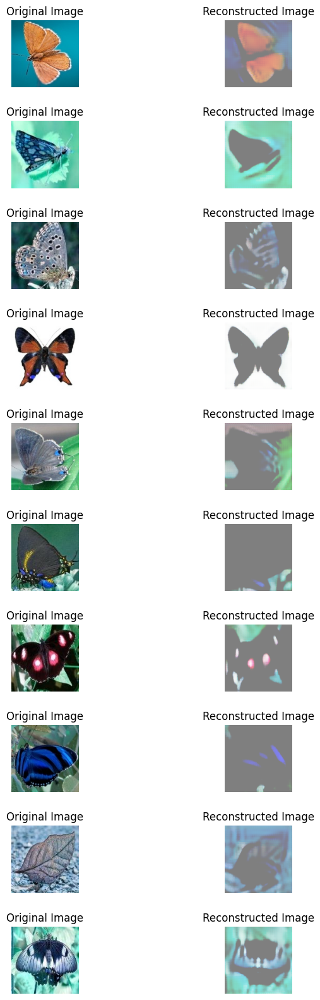

In [87]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/q7_vqvae/vq_vae_99.pth"
vqvae_model = torch.load(model_path)
vqvae_model.eval()
plot_reconstructed_images(vqvae_model, train_loader, num_images=10, device='cuda')

In [16]:
model_path = "/home/siddharth/siddharth/ADRL/Assignment 2/Models/q7_vqvae/vq_vae_99.pth"
vqvae_model = torch.load(model_path)
vqvae_model.eval()
reconstructions, labels, latents = posterior_inference(vqvae_model,  train_loader,device='cuda')

/tmp/ipykernel_279939/2332469889.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vqvae_model = torch.load(model_path)


In [29]:
first_100_samples = latents[:100]

In [30]:
generated_images = vqvae_model.decoder(first_100_samples.to('cuda'))
generated_images.shape

torch.Size([100, 3, 128, 128])

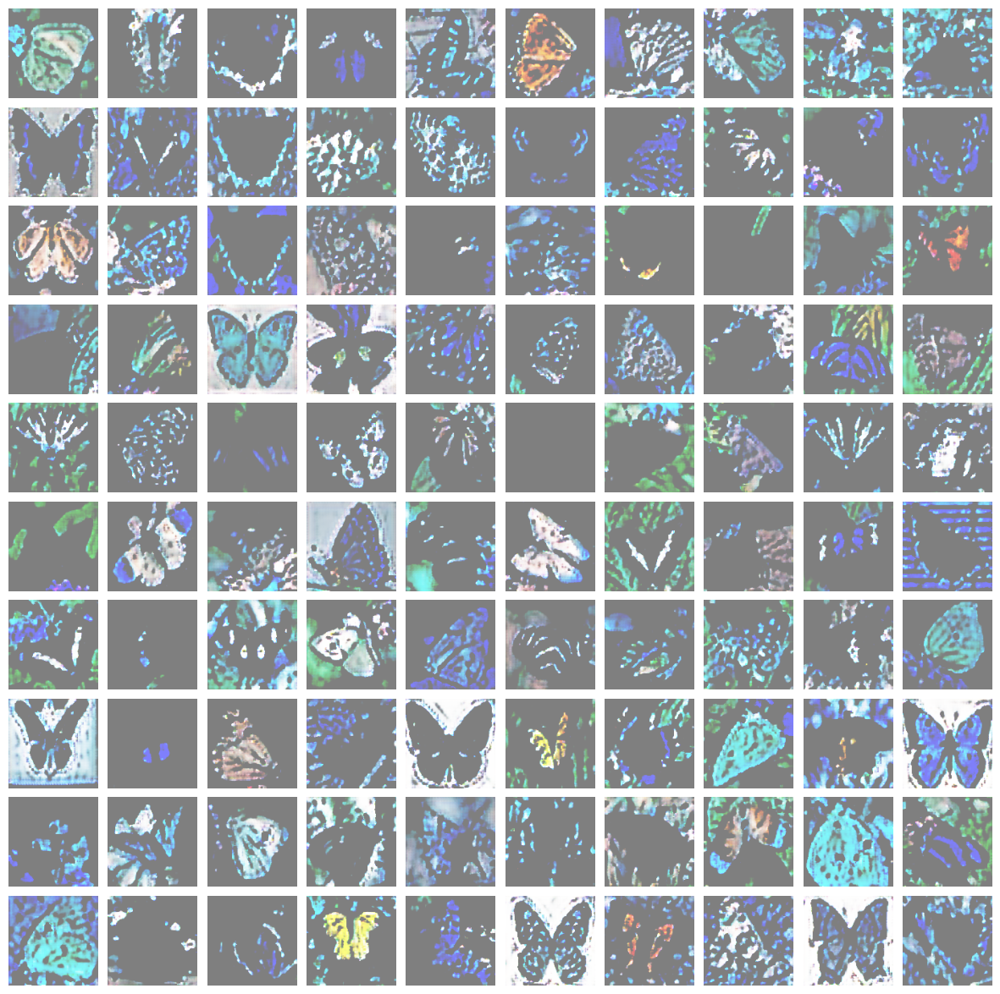

In [35]:
plot_generated_images(generated_images, num_images=100)

#### Classifier

##### 1. Standard

In [99]:
class LatentDataset(torch.utils.data.Dataset):
    def __init__(self, latents, labels):
        self.latents = latents
        self.labels = labels

    def __len__(self):
        return len(self.latents)

    def __getitem__(self, idx):
        return self.latents[idx], self.labels[idx]
    
class LatentClassifier(nn.Module):
    def __init__(self, latent_dim, num_classes, hidden_dim = 512, dropout_rate = 0.2):
        super(LatentClassifier, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim, num_classes)
        )
        
    def forward(self, x):
        return self.fc(x)

In [100]:
def train_latent_classifier(model, train_loader, num_epochs=10, lr=0.001, device='cuda'):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()  # Assuming it's a classification task
    model.to(device)
    
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        correct = 0
        total = 0
        
        tqdm_loader = tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')
        for latents, labels in tqdm_loader:
            latents = latents.to(device)
            
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(latents)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

            # Accuracy
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        avg_loss = total_loss / len(train_loader)
        accuracy = 100 * correct / total
        print(f'Epoch {epoch + 1}, Loss: {avg_loss:.4f}, Accuracy: {accuracy:.2f}%')

    print("Training complete.")

    return model

In [101]:
latents.shape[1:]
latents_flattened = latents.view(latents.size(0), -1)  
latents_flattened.shape

torch.Size([12998, 262144])

In [102]:
batch_size = 256
latents_flattened = latents.view(latents.size(0), -1)  
latent_dim = latents_flattened.size(1)
num_classes = 75

latent_data = LatentDataset(latents_flattened, labels)


# Split the dataset into train and validation
train_size = int(0.8 * len(latent_data))
test_size = len(latent_data) - train_size
train_dataset_butterfly, test_dataset_butterfly = random_split(latent_data, [train_size, test_size])

train_loader = DataLoader(train_dataset_butterfly, batch_size=batch_size, shuffle=True)

model = LatentClassifier(latent_dim, num_classes)

In [103]:
num_epochs = 50
lr = 0.01
device='cuda'

classifier_trained = train_latent_classifier(model, train_loader, num_epochs=num_epochs, lr=lr, device=device)

Epoch 1/50: 100%|██████████| 41/41 [00:02<00:00, 15.35it/s]


Epoch 1, Loss: 493.7943, Accuracy: 1.31%


Epoch 2/50: 100%|██████████| 41/41 [00:02<00:00, 15.86it/s]


Epoch 2, Loss: 11.3083, Accuracy: 1.38%


Epoch 3/50: 100%|██████████| 41/41 [00:02<00:00, 15.92it/s]


Epoch 3, Loss: 4.3166, Accuracy: 1.37%


Epoch 4/50: 100%|██████████| 41/41 [00:02<00:00, 15.93it/s]


Epoch 4, Loss: 4.3154, Accuracy: 1.35%


Epoch 5/50: 100%|██████████| 41/41 [00:02<00:00, 15.94it/s]


Epoch 5, Loss: 4.3144, Accuracy: 1.57%


Epoch 6/50: 100%|██████████| 41/41 [00:02<00:00, 15.96it/s]


Epoch 6, Loss: 4.3141, Accuracy: 1.35%


Epoch 7/50: 100%|██████████| 41/41 [00:02<00:00, 16.00it/s]


Epoch 7, Loss: 4.3140, Accuracy: 1.60%


Epoch 8/50: 100%|██████████| 41/41 [00:02<00:00, 16.06it/s]


Epoch 8, Loss: 4.3134, Accuracy: 1.60%


Epoch 9/50: 100%|██████████| 41/41 [00:02<00:00, 16.07it/s]


Epoch 9, Loss: 4.3133, Accuracy: 1.73%


Epoch 10/50: 100%|██████████| 41/41 [00:02<00:00, 16.17it/s]


Epoch 10, Loss: 4.3131, Accuracy: 1.88%


Epoch 11/50: 100%|██████████| 41/41 [00:02<00:00, 16.12it/s]


Epoch 11, Loss: 4.3133, Accuracy: 1.86%


Epoch 12/50: 100%|██████████| 41/41 [00:02<00:00, 16.09it/s]


Epoch 12, Loss: 4.3132, Accuracy: 1.84%


Epoch 13/50: 100%|██████████| 41/41 [00:02<00:00, 16.09it/s]


Epoch 13, Loss: 4.3132, Accuracy: 1.85%


Epoch 14/50: 100%|██████████| 41/41 [00:02<00:00, 16.05it/s]


Epoch 14, Loss: 4.3129, Accuracy: 2.00%


Epoch 15/50: 100%|██████████| 41/41 [00:02<00:00, 16.09it/s]


Epoch 15, Loss: 4.3131, Accuracy: 1.88%


Epoch 16/50: 100%|██████████| 41/41 [00:02<00:00, 16.14it/s]


Epoch 16, Loss: 4.3129, Accuracy: 1.90%


Epoch 17/50: 100%|██████████| 41/41 [00:02<00:00, 16.15it/s]


Epoch 17, Loss: 4.3131, Accuracy: 1.90%


Epoch 18/50: 100%|██████████| 41/41 [00:02<00:00, 16.05it/s]


Epoch 18, Loss: 4.3132, Accuracy: 1.91%


Epoch 19/50: 100%|██████████| 41/41 [00:02<00:00, 16.04it/s]


Epoch 19, Loss: 4.3131, Accuracy: 1.90%


Epoch 20/50: 100%|██████████| 41/41 [00:02<00:00, 16.03it/s]


Epoch 20, Loss: 4.3130, Accuracy: 1.90%


Epoch 21/50: 100%|██████████| 41/41 [00:02<00:00, 16.08it/s]


Epoch 21, Loss: 4.3129, Accuracy: 1.90%


Epoch 22/50: 100%|██████████| 41/41 [00:02<00:00, 15.98it/s]


Epoch 22, Loss: 4.3133, Accuracy: 1.90%


Epoch 23/50: 100%|██████████| 41/41 [00:02<00:00, 16.03it/s]


Epoch 23, Loss: 4.3131, Accuracy: 1.90%


Epoch 24/50: 100%|██████████| 41/41 [00:02<00:00, 15.19it/s]


Epoch 24, Loss: 4.3131, Accuracy: 1.90%


Epoch 25/50: 100%|██████████| 41/41 [00:02<00:00, 16.21it/s]


Epoch 25, Loss: 4.3131, Accuracy: 1.90%


Epoch 26/50: 100%|██████████| 41/41 [00:02<00:00, 16.26it/s]


Epoch 26, Loss: 4.3133, Accuracy: 1.90%


Epoch 27/50: 100%|██████████| 41/41 [00:02<00:00, 16.22it/s]


Epoch 27, Loss: 4.3129, Accuracy: 1.90%


Epoch 28/50: 100%|██████████| 41/41 [00:02<00:00, 16.24it/s]


Epoch 28, Loss: 4.3130, Accuracy: 1.90%


Epoch 29/50: 100%|██████████| 41/41 [00:02<00:00, 16.12it/s]


Epoch 29, Loss: 4.3132, Accuracy: 1.90%


Epoch 30/50: 100%|██████████| 41/41 [00:02<00:00, 15.87it/s]


Epoch 30, Loss: 4.3133, Accuracy: 1.90%


Epoch 31/50: 100%|██████████| 41/41 [00:02<00:00, 15.77it/s]


Epoch 31, Loss: 4.3128, Accuracy: 1.90%


Epoch 32/50: 100%|██████████| 41/41 [00:02<00:00, 15.87it/s]


Epoch 32, Loss: 4.3131, Accuracy: 1.90%


Epoch 33/50: 100%|██████████| 41/41 [00:02<00:00, 15.94it/s]


Epoch 33, Loss: 4.3132, Accuracy: 1.90%


Epoch 34/50: 100%|██████████| 41/41 [00:02<00:00, 16.10it/s]


Epoch 34, Loss: 4.3130, Accuracy: 1.90%


Epoch 35/50: 100%|██████████| 41/41 [00:02<00:00, 16.33it/s]


Epoch 35, Loss: 4.3131, Accuracy: 1.90%


Epoch 36/50: 100%|██████████| 41/41 [00:02<00:00, 16.31it/s]


Epoch 36, Loss: 4.3133, Accuracy: 1.90%


Epoch 37/50: 100%|██████████| 41/41 [00:02<00:00, 16.26it/s]


Epoch 37, Loss: 4.3132, Accuracy: 1.90%


Epoch 38/50: 100%|██████████| 41/41 [00:02<00:00, 16.28it/s]


Epoch 38, Loss: 4.3132, Accuracy: 1.90%


Epoch 39/50: 100%|██████████| 41/41 [00:02<00:00, 16.23it/s]


Epoch 39, Loss: 4.3134, Accuracy: 1.90%


Epoch 40/50: 100%|██████████| 41/41 [00:02<00:00, 16.35it/s]


Epoch 40, Loss: 4.3131, Accuracy: 1.90%


Epoch 41/50: 100%|██████████| 41/41 [00:02<00:00, 16.38it/s]


Epoch 41, Loss: 4.3129, Accuracy: 1.90%


Epoch 42/50: 100%|██████████| 41/41 [00:02<00:00, 16.38it/s]


Epoch 42, Loss: 4.3131, Accuracy: 1.90%


Epoch 43/50: 100%|██████████| 41/41 [00:02<00:00, 16.23it/s]


Epoch 43, Loss: 4.3132, Accuracy: 1.90%


Epoch 44/50: 100%|██████████| 41/41 [00:02<00:00, 16.31it/s]


Epoch 44, Loss: 4.3134, Accuracy: 1.90%


Epoch 45/50: 100%|██████████| 41/41 [00:02<00:00, 16.32it/s]


Epoch 45, Loss: 4.3129, Accuracy: 1.90%


Epoch 46/50: 100%|██████████| 41/41 [00:02<00:00, 16.30it/s]


Epoch 46, Loss: 4.3134, Accuracy: 1.90%


Epoch 47/50: 100%|██████████| 41/41 [00:02<00:00, 16.23it/s]


Epoch 47, Loss: 4.3132, Accuracy: 1.90%


Epoch 48/50: 100%|██████████| 41/41 [00:02<00:00, 16.37it/s]


Epoch 48, Loss: 4.3132, Accuracy: 1.90%


Epoch 49/50: 100%|██████████| 41/41 [00:02<00:00, 16.30it/s]


Epoch 49, Loss: 4.3131, Accuracy: 1.90%


Epoch 50/50: 100%|██████████| 41/41 [00:02<00:00, 16.34it/s]

Epoch 50, Loss: 4.3132, Accuracy: 1.90%
Training complete.


In [104]:
def evaluate_latent_classifier(model, test_loader, device='cuda'):
    model.eval()  
    total_loss = 0
    correct = 0
    total = 0
    criterion = nn.CrossEntropyLoss()  
    all_predictions = []
    all_labels = []

    with torch.no_grad():  
        for latents, labels in test_loader:
            latents = latents.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(latents)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # Get predictions
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    avg_loss = total_loss / len(test_loader)
    accuracy = 100 * correct / total
    print(f'Test Loss: {avg_loss:.4f}, Accuracy: {accuracy:.2f}%')

    print(f'\nTest Evaluation Results:')
    print(f'Test Loss: {avg_loss:.4f}')
    print(f'Accuracy: {accuracy:.2f}%')

In [105]:
test_loader = DataLoader(test_dataset_butterfly, batch_size=batch_size, shuffle=True)

evaluate_latent_classifier(classifier_trained, test_loader)


Test Loss: 4.3213, Accuracy: 2.46%

Test Evaluation Results:
Test Loss: 4.3213
Accuracy: 2.46%


##### Resnet Classsifier

In [117]:
class LatentResNetClassifier(nn.Module):
    def __init__(self, num_classes):
        super(LatentResNetClassifier, self).__init__()
        
        self.resnet = models.resnet18(weights='DEFAULT')  

        self.resnet.conv1 = nn.Conv2d(256, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        self.resnet.maxpool = nn.Identity()  
        
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, num_classes)

    def forward(self, x):
        return self.resnet(x)

In [118]:

def train_resnet_classifier(model, train_loader, num_epochs=10, lr=0.001, device='cuda'):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    model.to(device)
    
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        correct = 0
        total = 0
        
        tqdm_loader = tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')
        for latents, labels in tqdm_loader:
            latents = latents.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(latents)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

            # Accuracy
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        avg_loss = total_loss / len(train_loader)
        accuracy = 100 * correct / total
        print(f'Epoch {epoch + 1}, Loss: {avg_loss:.4f}, Accuracy: {accuracy:.2f}%')

    print("Training complete.")

    return model


In [119]:
latents.size()


torch.Size([12998, 256, 32, 32])

In [120]:
batch_size = 256
# latents_flattened = latents.view(latents.size(0), -1)  
latent_dim = latents.size(1)
num_classes = 75

latent_data = LatentDataset(latents, labels)

# Split the dataset into train and validation
train_size = int(0.8 * len(latent_data))
test_size = len(latent_data) - train_size
train_dataset_butterfly, test_dataset_butterfly = random_split(latent_data, [train_size, test_size])

train_loader = DataLoader(train_dataset_butterfly, batch_size=batch_size, shuffle=True)


In [178]:
num_classes = 75  
num_epochs = 50
lr = 0.001
device = 'cuda' if torch.cuda.is_available() else 'cpu'

resnet_model = LatentResNetClassifier(num_classes)
trained_model = train_resnet_classifier(resnet_model, train_loader, num_epochs=num_epochs, lr=lr, device=device)

Epoch 1/50: 100%|██████████| 41/41 [00:02<00:00, 16.35it/s]


Epoch 1, Loss: 3.1236, Accuracy: 22.89%


Epoch 2/50: 100%|██████████| 41/41 [00:02<00:00, 16.35it/s]


Epoch 2, Loss: 1.9641, Accuracy: 46.31%


Epoch 3/50: 100%|██████████| 41/41 [00:02<00:00, 16.34it/s]


Epoch 3, Loss: 1.4614, Accuracy: 58.67%


Epoch 4/50: 100%|██████████| 41/41 [00:02<00:00, 16.32it/s]


Epoch 4, Loss: 1.0452, Accuracy: 69.90%


Epoch 5/50: 100%|██████████| 41/41 [00:02<00:00, 16.32it/s]


Epoch 5, Loss: 0.7245, Accuracy: 78.77%


Epoch 6/50: 100%|██████████| 41/41 [00:02<00:00, 16.28it/s]


Epoch 6, Loss: 0.4741, Accuracy: 86.48%


Epoch 7/50: 100%|██████████| 41/41 [00:02<00:00, 16.28it/s]


Epoch 7, Loss: 0.3216, Accuracy: 90.58%


Epoch 8/50: 100%|██████████| 41/41 [00:02<00:00, 16.34it/s]


Epoch 8, Loss: 0.2133, Accuracy: 94.05%


Epoch 9/50: 100%|██████████| 41/41 [00:02<00:00, 16.38it/s]


Epoch 9, Loss: 0.1629, Accuracy: 95.54%


Epoch 10/50: 100%|██████████| 41/41 [00:02<00:00, 16.33it/s]


Epoch 10, Loss: 0.1108, Accuracy: 97.11%


Epoch 11/50: 100%|██████████| 41/41 [00:02<00:00, 16.29it/s]


Epoch 11, Loss: 0.0987, Accuracy: 97.16%


Epoch 12/50: 100%|██████████| 41/41 [00:02<00:00, 16.27it/s]


Epoch 12, Loss: 0.0972, Accuracy: 97.38%


Epoch 13/50: 100%|██████████| 41/41 [00:02<00:00, 16.31it/s]


Epoch 13, Loss: 0.0978, Accuracy: 97.10%


Epoch 14/50: 100%|██████████| 41/41 [00:02<00:00, 16.31it/s]


Epoch 14, Loss: 0.0977, Accuracy: 96.95%


Epoch 15/50: 100%|██████████| 41/41 [00:03<00:00, 13.56it/s]


Epoch 15, Loss: 0.1180, Accuracy: 96.53%


Epoch 16/50: 100%|██████████| 41/41 [00:02<00:00, 16.14it/s]


Epoch 16, Loss: 0.1334, Accuracy: 95.80%


Epoch 17/50: 100%|██████████| 41/41 [00:02<00:00, 16.18it/s]


Epoch 17, Loss: 0.1056, Accuracy: 96.55%


Epoch 18/50: 100%|██████████| 41/41 [00:02<00:00, 16.24it/s]


Epoch 18, Loss: 0.0856, Accuracy: 97.43%


Epoch 19/50: 100%|██████████| 41/41 [00:02<00:00, 16.35it/s]


Epoch 19, Loss: 0.0522, Accuracy: 98.54%


Epoch 20/50: 100%|██████████| 41/41 [00:02<00:00, 16.36it/s]


Epoch 20, Loss: 0.0405, Accuracy: 98.90%


Epoch 21/50: 100%|██████████| 41/41 [00:02<00:00, 16.26it/s]


Epoch 21, Loss: 0.0263, Accuracy: 99.29%


Epoch 22/50: 100%|██████████| 41/41 [00:02<00:00, 16.30it/s]


Epoch 22, Loss: 0.0170, Accuracy: 99.59%


Epoch 23/50: 100%|██████████| 41/41 [00:02<00:00, 16.26it/s]


Epoch 23, Loss: 0.0150, Accuracy: 99.64%


Epoch 24/50: 100%|██████████| 41/41 [00:02<00:00, 16.33it/s]


Epoch 24, Loss: 0.0133, Accuracy: 99.66%


Epoch 25/50: 100%|██████████| 41/41 [00:02<00:00, 16.32it/s]


Epoch 25, Loss: 0.0155, Accuracy: 99.62%


Epoch 26/50: 100%|██████████| 41/41 [00:02<00:00, 16.28it/s]


Epoch 26, Loss: 0.0236, Accuracy: 99.30%


Epoch 27/50: 100%|██████████| 41/41 [00:02<00:00, 16.38it/s]


Epoch 27, Loss: 0.0293, Accuracy: 99.22%


Epoch 28/50: 100%|██████████| 41/41 [00:02<00:00, 16.43it/s]


Epoch 28, Loss: 0.0612, Accuracy: 98.34%


Epoch 29/50: 100%|██████████| 41/41 [00:02<00:00, 16.34it/s]


Epoch 29, Loss: 0.1208, Accuracy: 96.28%


Epoch 30/50: 100%|██████████| 41/41 [00:02<00:00, 16.31it/s]


Epoch 30, Loss: 0.1391, Accuracy: 95.76%


Epoch 31/50: 100%|██████████| 41/41 [00:02<00:00, 16.22it/s]


Epoch 31, Loss: 0.1622, Accuracy: 95.16%


Epoch 32/50: 100%|██████████| 41/41 [00:02<00:00, 16.34it/s]


Epoch 32, Loss: 0.1114, Accuracy: 96.49%


Epoch 33/50: 100%|██████████| 41/41 [00:02<00:00, 16.35it/s]


Epoch 33, Loss: 0.0680, Accuracy: 97.98%


Epoch 34/50: 100%|██████████| 41/41 [00:02<00:00, 16.28it/s]


Epoch 34, Loss: 0.0353, Accuracy: 99.00%


Epoch 35/50: 100%|██████████| 41/41 [00:02<00:00, 16.34it/s]


Epoch 35, Loss: 0.0144, Accuracy: 99.61%


Epoch 36/50: 100%|██████████| 41/41 [00:02<00:00, 16.37it/s]


Epoch 36, Loss: 0.0053, Accuracy: 99.90%


Epoch 37/50: 100%|██████████| 41/41 [00:02<00:00, 16.36it/s]


Epoch 37, Loss: 0.0082, Accuracy: 99.83%


Epoch 38/50: 100%|██████████| 41/41 [00:02<00:00, 16.36it/s]


Epoch 38, Loss: 0.0115, Accuracy: 99.73%


Epoch 39/50: 100%|██████████| 41/41 [00:02<00:00, 16.32it/s]


Epoch 39, Loss: 0.0047, Accuracy: 99.87%


Epoch 40/50: 100%|██████████| 41/41 [00:02<00:00, 16.23it/s]


Epoch 40, Loss: 0.0016, Accuracy: 99.96%


Epoch 41/50: 100%|██████████| 41/41 [00:02<00:00, 16.28it/s]


Epoch 41, Loss: 0.0009, Accuracy: 99.98%


Epoch 42/50: 100%|██████████| 41/41 [00:02<00:00, 16.36it/s]


Epoch 42, Loss: 0.0003, Accuracy: 100.00%


Epoch 43/50: 100%|██████████| 41/41 [00:02<00:00, 16.41it/s]


Epoch 43, Loss: 0.0002, Accuracy: 100.00%


Epoch 44/50: 100%|██████████| 41/41 [00:02<00:00, 16.39it/s]


Epoch 44, Loss: 0.0002, Accuracy: 100.00%


Epoch 45/50: 100%|██████████| 41/41 [00:02<00:00, 16.36it/s]


Epoch 45, Loss: 0.0002, Accuracy: 100.00%


Epoch 46/50: 100%|██████████| 41/41 [00:02<00:00, 16.29it/s]


Epoch 46, Loss: 0.0002, Accuracy: 100.00%


Epoch 47/50: 100%|██████████| 41/41 [00:02<00:00, 16.21it/s]


Epoch 47, Loss: 0.0001, Accuracy: 100.00%


Epoch 48/50: 100%|██████████| 41/41 [00:02<00:00, 16.19it/s]


Epoch 48, Loss: 0.0001, Accuracy: 100.00%


Epoch 49/50: 100%|██████████| 41/41 [00:02<00:00, 16.17it/s]


Epoch 49, Loss: 0.0001, Accuracy: 100.00%


Epoch 50/50: 100%|██████████| 41/41 [00:02<00:00, 16.18it/s]

Epoch 50, Loss: 0.0001, Accuracy: 100.00%
Training complete.


In [179]:
def evaluate_model(model, data_loader, device='cuda'):
    model.eval()  
    total_loss = 0
    correct = 0
    total = 0
    all_predictions = []
    all_labels = []

    criterion = nn.CrossEntropyLoss()  
    
    with torch.no_grad():  
        for latents, labels in data_loader:
            latents = latents.to(device)
            labels = labels.to(device)

            outputs = model(latents)
            loss = criterion(outputs, labels)

            total_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    avg_loss = total_loss / len(data_loader)
    accuracy = 100 * correct / total
    print(f'Evaluation Loss: {avg_loss:.4f}, Accuracy: {accuracy:.2f}%')

    all_predictions = np.array(all_predictions)
    all_labels = np.array(all_labels)

    return all_predictions, all_labels

def plot_confusion_matrix_i(y_true, y_pred, classes, title='Confusion Matrix'):
 
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(12, 10))
    sns.set(font_scale=1.2)  # Increase font size for better readability

    # Create the heatmap with stronger emphasis on color
    heatmap = sns.heatmap(cm, annot=False, cmap='Blues',  # Remove annotations
                           xticklabels=classes, yticklabels=classes,
                           cbar=True, square=True, linewidths=.5, 
                           linecolor='black')  # Add grid lines for clarity

    # Add labels and title
    plt.title(title, fontsize=18)
    plt.ylabel('True label', fontsize=16)
    plt.xlabel('Predicted label', fontsize=16)

    # Show the plot
    plt.tight_layout()
    plt.show()

In [180]:
test_loader = DataLoader(test_dataset_butterfly, batch_size=batch_size, shuffle=True)

predictions, true_labels = evaluate_model(trained_model, test_loader, device=device)

Evaluation Loss: 1.3834, Accuracy: 73.31%


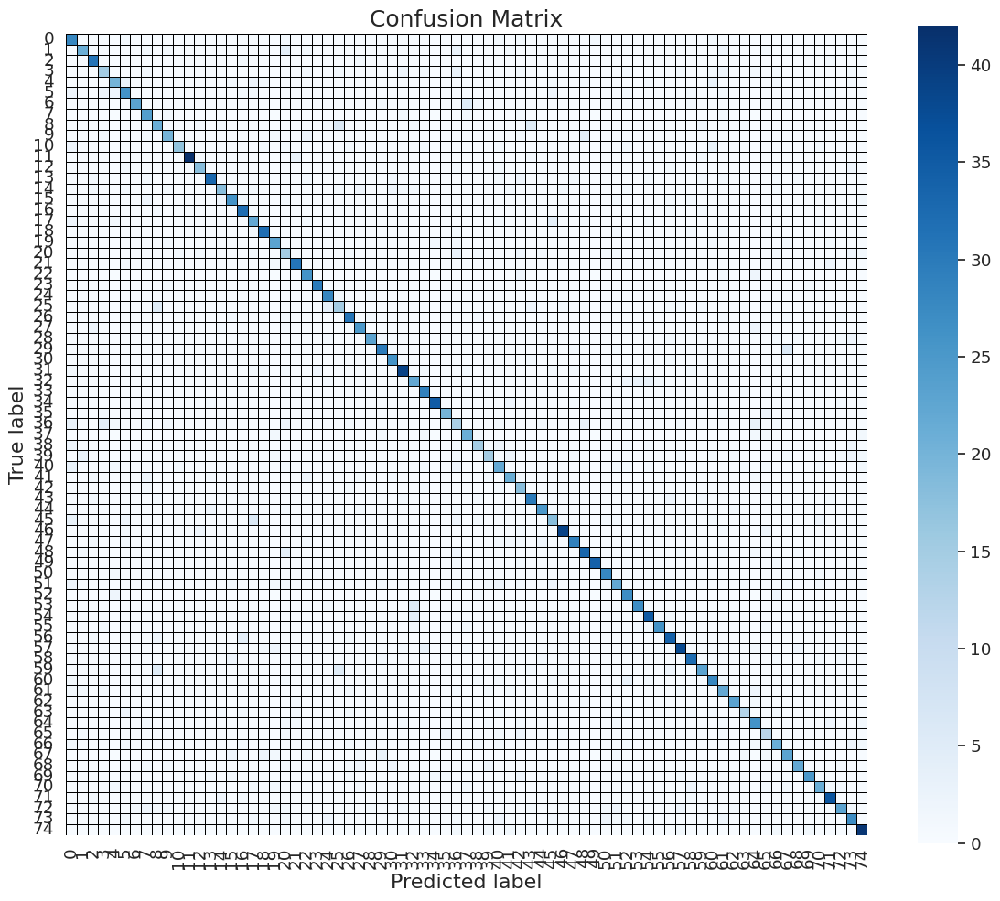

In [181]:

plot_confusion_matrix_i(true_labels, predictions, classes=np.unique(true_labels))


### 10. GMM  (Q.8)

In [83]:
latents_flattened = latents.view(latents.size(0), -1)
latents.shape, latents_flattened.shape

(torch.Size([12998, 256, 32, 32]), torch.Size([12998, 262144]))

In [84]:

def gmm_model_training(z, n_components=4, max_iter=100, tol=1e-3, random_state=42):
    z = z.cpu().numpy()
    gmm_model = GaussianMixture(n_components=n_components, covariance_type='diag', max_iter=max_iter, tol=tol, random_state=random_state)
    gmm_model.fit(z)
    return gmm_model

def gmm_sample(gmm_model, n_samples=100):
    z_sample, y_sample = gmm_model.sample(n_samples)
    z_sample = torch.tensor(z_sample).float()
    return z_sample

In [85]:
gmm_model = gmm_model_training(latents_flattened, n_components=3)

In [87]:
gmm_sampled_latents = gmm_sample(gmm_model, n_samples=10)
gmm_sampled_latents.shape

torch.Size([10, 262144])

In [88]:
gmm_sampled_latents = gmm_sampled_latents.reshape(10, 256, 32, 32)

In [89]:
generated_images = vqvae_model.decoder(gmm_sampled_latents.to('cuda'))
generated_images.shape

torch.Size([10, 3, 128, 128])

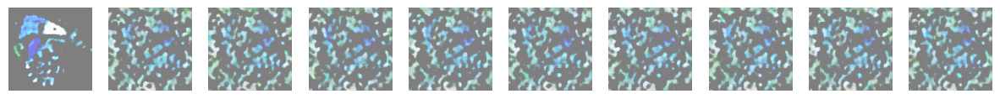

In [82]:
plot_generated_images(generated_images, num_images=10)